<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">

## DSI-SG-42 Capstone Project:
## Ace Advantage: Serve Optimization for Tennis Players

> Authors: Ngan Han Kiong
---

**Problem Statement:** 

How might we develop a data-driven approach to analyze serve performance data and develop personalized strategies for optimizing serve accuracy, power, and placement, thereby empowering tennis players to enhance their on-court performance and gain a competitive edge in matches?

**Persona:**

Alex, a seasoned tennis coach, brings over 15 years of experience to the court. 
Passionate about player development, he seeks innovative, data-driven solutions to optimize serves and gain a competitive edge in tournaments. 
Alex's goal is to help players of all levels reach their full potential while staying ahead of industry trends and technology advancements. 
With a focus on enhancing serve accuracy, power, and placement, Alex navigates challenges and pressures to maintain his reputation as a top-tier coach, driven by a commitment to excellence and success on the court.

These are the notebooks for this project:  
 1. `01_Predicting_Tenni_Serve_Outcomes.ipynb`  
 2. `02_Pose_Detection_and_Analysis.ipynb`
 
 ---   

### Part 2 Pose Estimation and Analysis

### Introduction to Pose Estimation with MoveNet

What is Pose Estimation?
Pose estimation is a computer vision technique used to detect and track the human body's keypoints (such as joints and skeletal structure) in images or videos. This information can be valuable for various applications, including activity recognition, motion analysis, and human-computer interaction.

What is MoveNet?
MoveNet is a state-of-the-art deep learning model developed by Google Research for real-time human pose estimation. It utilizes lightweight convolutional neural networks (CNNs) optimized for mobile and edge devices. MoveNet is designed to accurately detect multiple keypoints across the human body while maintaining efficiency, making it suitable for real-time applications on devices with limited computational resources.

Key Features of MoveNet:
1. Efficiency: MoveNet achieves high inference speed and low latency, making it suitable for real-time applications.
2. Accuracy: Despite its lightweight architecture, MoveNet maintains high accuracy in detecting human keypoints.
3. Multi-Person Pose Estimation: MoveNet can detect and track multiple individuals simultaneously in a single frame.
4. Variants: MoveNet comes in different variants optimized for various use cases, including single pose estimation and multi-pose estimation.

Using MoveNet for Tennis Serve Optimization:
In my project, I am leveraging MoveNet to analyze the key poses and movements involved in a tennis serve. By detecting and tracking the player's body keypoints throughout the serve motion, I can extract valuable insights to optimize technique, improve performance, and prevent injuries.

For this part on pose estimation using MoveNet, these are the sections:

1. **Install and Import Required Libraries**: Ensuring the necessary libraries installed, such as TensorFlow or TensorFlow Lite for inference.
2. **Download MoveNet Model**: Download the pre-trained MoveNet model suitable for my use case i.e. multi-pose estimation.
3. **Load the Model**: Load the MoveNet model into your notebook using appropriate APIs provided by TensorFlow or TensorFlow Lite.
4. **Define Utility Functions**: Utility functions include `crop video` to crop videos to a specific time interval, `calculate angle` to calculate angles formed by three points, `draw_keypoints` to visually represent keypoints detected in video frames and `draw_connections` visualizes connections between keypoints detected in video frames.
5. **Define Visualization Functions**: Visualization function includes `loop through people` to process each person detected in a video frame.
6. **Define Data Analysis Functions**: Data analysis functions include `analyze_tennis_serves` and `analyze_people` to analyze the mechanics of tennis serves by examining the angles at key joints during a serve.
7. **Process Video Data**: extracting and analyzing biomechanical data from video recordings of tennis serves with the function `process_video`
8. **Biomechanical Analysis of Tennis Serve Techniques**: Analyze the detected poses to extract insights relevant to tennis serve optimization, such as body alignment, joint angles, and motion dynamics. Visualize the detected keypoints and pose estimations on the tennis serve video frames for qualitative analysis and interpretation.
9. **Conclusions and Recommendations**:

---
### 1. Import Libraries and Load Model

This section of the notebook details the process of loading the MoveNet model, a state-of-the-art pose estimation model designed to detect human poses in real-time. The model's efficiency and accuracy make it particularly suitable for sports analytics, including tennis serve analysis.

Model Overview
- MoveNet: An efficient and lightweight model from Google that provides high-accuracy pose estimations with minimal computational resources. MoveNet is designed to detect multiple human figures in a single frame, making it ideal for analyzing sports activities where multiple players might be present.

Implementation Details
- Model Loading:
    - Source: The model is loaded from a hosted URL on Kaggle, which provides a pre-trained MoveNet model in TensorFlow format.
    - hub.load: This function from TensorFlow Hub is used to download and load the pre-trained model.
- serving_default Signature:
    - Once loaded, the serving_default signature of the model is accessed. This signature facilitates the model's use for inference, allowing it to receive input tensors and return pose estimations.

Usage

This loaded model will be used to perform pose estimations on frames extracted from videos of tennis serves. By analyzing these poses, we can assess the biomechanics of players' movements, identify potential areas for performance enhancement, and detect movements that might lead to injuries.

In [16]:
pip list

Package                       Version
----------------------------- ------------
absl-py                       2.1.0
aiobotocore                   2.5.0
aiofiles                      22.1.0
aiohttp                       3.8.5
aioitertools                  0.7.1
aiosignal                     1.2.0
aiosqlite                     0.18.0
alabaster                     0.7.12
altair                        5.2.0
anaconda-anon-usage           0.4.2
anaconda-catalogs             0.2.0
anaconda-client               1.12.1
anaconda-cloud-auth           0.1.3
anaconda-navigator            2.5.0
anaconda-project              0.11.1
anyio                         3.5.0
appdirs                       1.4.4
applaunchservices             0.3.0
appnope                       0.1.2
appscript                     1.1.2
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
arrow                         1.2.3
astroid                       2.14.2
astropy                       5.1
asttokens    

In [2]:
import tensorflow as tf
import tensorflow_hub as hub
import cv2
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from scipy.stats import ttest_ind, pearsonr
import seaborn as sns

2024-05-10 01:20:38.339183: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
# Load the MoveNet model
model = hub.load("https://www.kaggle.com/models/google/movenet/TensorFlow2/multipose-lightning/1")
movenet = model.signatures['serving_default']

---
### 2. Define Utility Functions

This first function `crop_video` designed to crop video clips to a specific time interval. 

This functionality is crucial for focusing the pose estimation analysis on relevant sections of a video where the action (e.g., a tennis serve) occurs. The ability to isolate these segments allows for a more efficient and targeted analysis, reducing computational load and improving the accuracy of the pose estimation.

Function Overview
- crop_video(video_path, start_sec, stop_sec, output_path):
- Parameters:
    - video_path: The file path of the input video.
    - start_sec: The start time in seconds from which the video will be cropped.
    - stop_sec: The end time in seconds at which the video cropping will stop.
    - output_path: The file path where the cropped video will be saved.
- Functionality:
    - Opens the specified video file and sets the frame pointer to the start of the desired segment.
    - Reads and writes each frame from the start to the end time into a new video file.
    - Utilizes OpenCV's capabilities to handle video operations efficiently.

In [5]:
# Function to crop videos based on start and stop seconds
def crop_video(video_path, start_sec, stop_sec, output_path):
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print("Error opening video file")
        return

    fps = cap.get(cv2.CAP_PROP_FPS)
    start_frame = int(start_sec * fps)
    stop_frame = int(stop_sec * fps)

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    out = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

    cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        current_frame = cap.get(cv2.CAP_PROP_POS_FRAMES)
        if current_frame > stop_frame:
            break

        out.write(frame)

    cap.release()
    out.release()
    print(f"Video has been cropped and saved to {output_path}")

The second function `calculate_angle` calculates the angle formed by three points, typically representing joints in human pose estimation. Accurate calculation of joint angles is essential for analyzing movements, such as those in athletic performances, to evaluate form and biomechanics.

Function Overview
- calculate_angle(pointA, pointB, pointC):
    - Purpose: Computes the angle at pointB, formed by vectors pointA-pointB and pointC-pointB.
    - Parameters:
        - pointA, pointB, pointC: Coordinates of the three points. These can be 2D or 3D vectors, depending on the application.
- Returns: The angle in degrees between the two vectors originating from pointB.
- Calculation Details:
    - The function calculates the dot product of the vectors formed between pointB and the other two points.
    - It then uses the norm (magnitude) of these vectors and the dot product to find the cosine of the angle (using the cosine rule).
    - Finally, the cosine value is transformed into an angle in radians using arccos, which is then converted to degrees.

Importance of Angle Calculation<br>
Computing angles is critical in many fields, including biomechanics, robotics, and computer graphics. In sports science, specifically, analyzing the angles of joints during movements like tennis serves or swings can help in improving technique, preventing injuries, and enhancing overall athletic performance.

Application<br>
In this project, the function is used to analyze the joint angles during tennis serves. By integrating this function with pose estimation data, it provides a powerful tool for detailed motion analysis and performance optimization in sports.

In [6]:
# Function to calculate angle between three points
def calculate_angle(pointA, pointB, pointC):
    vector1 = pointA - pointB
    vector2 = pointC - pointB
    dot_product = np.dot(vector1, vector2)
    norm1 = np.linalg.norm(vector1)
    norm2 = np.linalg.norm(vector2)
    cos_theta = dot_product / (norm1 * norm2)
    angle_rad = np.arccos(cos_theta)
    angle_deg = np.degrees(angle_rad)
    return angle_deg

The third function `draw_keypoints` designed to visually represent keypoints detected in video frames. The ability to mark keypoints on the video frames is critical for verifying the accuracy of pose estimation algorithms and provides an intuitive way to monitor the dynamics captured in the video.

Function Overview
- draw_keypoints(frame, keypoints, confidence_threshold):
    - Purpose: Draws keypoints on a given video frame if their confidence scores exceed a specified threshold.
- Parameters:
    - frame: The video frame on which keypoints will be drawn.
    - keypoints: A list of keypoints, each represented by (y, x, confidence) coordinates and confidence score.
    - confidence_threshold: The minimum confidence score required for a keypoint to be drawn.
- Functionality:
    - Iterates through each keypoint, checking if its confidence score is above the threshold.
    - For each keypoint that meets the threshold, draws a green circle at the keypoint's coordinates.
- Visualization Enhancement:
    - Uses OpenCV's circle function to mark keypoints, enhancing the visual analysis of pose estimation results.

Application

This function is crucial for debugging and enhancing pose estimation models by allowing real-time visualization of detected keypoints. It can be particularly useful in interactive scenarios where immediate feedback on pose detection is needed, such as in sports analytics or in developing interactive computer vision applications.

In [7]:
# Function to draw keypoints on frame
def draw_keypoints(frame, keypoints, confidence_threshold):
    y, x, c = frame.shape
    shaped = np.squeeze(np.multiply(keypoints, [y,x,1]))
    
    for kp in shaped:
        ky, kx, kp_conf = kp
        if kp_conf > confidence_threshold:
            cv2.circle(frame, (int(kx), int(ky)), 6, (0,255,0), -1)

The last function `draw_connections` visualizes connections between keypoints detected in video frames. These connections represent the skeletal structure of the subjects in the video, which is crucial for understanding human movements and interactions.

Function Overview
- draw_connections(frame, keypoints, edges, confidence_threshold):
    - Purpose: Draws lines between pairs of keypoints on a video frame to illustrate the connections that form the skeletal structure, based on a specified confidence threshold.
- Parameters:
    - frame: The video frame on which to draw the connections.
    - keypoints: Array of keypoints, where each keypoint includes coordinates and a confidence score.
    - edges: Dictionary that maps pairs of keypoints (defined by their indices) to colors (although in this version, all lines are drawn in red).
    - confidence_threshold: Minimum confidence score required for a connection to be drawn.
- Functionality:
    - For each pair of keypoints defined in the edges dictionary, the function checks if both keypoints meet the confidence threshold.
    - If they do, a line is drawn between them on the frame using OpenCV's line function.

Defining Edges
- EDGES Dictionary:
    - Purpose: Maps pairs of keypoints to specific colors, representing the skeletal connections between these joints.
    - Keys: Each key is a tuple of two integers representing the indices of the keypoints that should be connected.
    - Values: Each value is a string representing the color to use for the line drawn between the connected keypoints.
    - Example Connections:
        - (0, 1): Connects keypoint 0 to keypoint 1 using a magenta ('m') color.
        - (5, 6): Connects keypoint 5 to keypoint 6 using a yellow ('y') color.

The order of the 17 keypoint joints is: [nose, left eye, right eye, left ear, right ear, left shoulder, right shoulder, left elbow, right elbow, left wrist, right wrist, left hip, right hip, left knee, right knee, left ankle, right ankle].

<div style="text-align:center;">
    <img src="../assets/MoveNet-Lightning.jpg" style="height: 500px;">
</div>

Importance of Skeletal Visualization
Visualizing these connections helps in:
- Pose Verification: Ensuring that pose estimation algorithms are accurately detecting body parts.
- Biomechanical Analysis: Analyzing the positions and movements of different body parts during physical activities such as sports.
- Education and Training: Helping athletes and coaches visually assess performance and technique.

Application
This functionality is particularly useful in sports science and animation, where understanding the physical movement dynamics is crucial. By visualizing these keypoints and their connections, researchers and practitioners can gain insights into the biomechanics of movement, potentially aiding in performance improvement and injury prevention.

In [8]:
# Function to draw connections between keypoints on frame
def draw_connections(frame, keypoints, edges, confidence_threshold):
    y, x, c = frame.shape
    shaped = np.squeeze(np.multiply(keypoints, [y,x,1]))
    
    for edge, color in edges.items():
        p1, p2 = edge
        y1, x1, c1 = shaped[p1]
        y2, x2, c2 = shaped[p2]
        
        if (c1 > confidence_threshold) & (c2 > confidence_threshold):      
            cv2.line(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0,0,255), 4)

# Define edges for drawing connections between keypoints
EDGES = {
    (0, 1): 'm',
    (0, 2): 'c',
    (1, 3): 'm',
    (2, 4): 'c',
    (0, 5): 'm',
    (0, 6): 'c',
    (5, 7): 'm',
    (7, 9): 'm',
    (6, 8): 'c',
    (8, 10): 'c',
    (5, 6): 'y',
    (5, 11): 'm',
    (6, 12): 'c',
    (11, 12): 'y',
    (11, 13): 'm',
    (13, 15): 'm',
    (12, 14): 'c',
    (14, 16): 'c'
}

---
### 3. Define Visualization Functions

The function `loop through people` is designed to process each person detected in a video frame, drawing both their keypoints and the skeletal connections based on a confidence threshold. This visual representation is vital for analyzing human poses and movements effectively.

Function Overview
- loop_through_people(frame, keypoints_with_scores, edges, confidence_threshold):
    - Purpose: Iterates through each person detected in the frame and visualizes their keypoints and the connections between them, enhancing the analysis of pose estimation results.
- Parameters:
    - frame: The video frame to modify.
    - keypoints_with_scores: Array of detected keypoints for each person, including the confidence scores.
    - edges: A dictionary specifying pairs of keypoints to connect and the colors of the lines (if applicable).
    - confidence_threshold: The minimum confidence score for a keypoint to be visualized.
- Functionality:
    - For each person in the frame, it calls two functions:
        - draw_connections: Draws lines between keypoints that meet the confidence threshold, according to the specified edges.
        - draw_keypoints: Places visual markers on keypoints that exceed the confidence threshold.
- Visualization Enhancement:
    - This function ensures that each detected person is displayed with clear and accurate visual markers, enhancing the ability to analyze and interpret the pose data effectively.

Importance of Visualization<br>
The visualization of keypoints and skeletal connections is essential for:
- Pose Accuracy Checks: Quickly verifying the accuracy of pose detections in real-time applications.
- Movement Analysis: Providing a visual understanding of how different body parts are interacting during movements, which is crucial for sports performance and biomechanical studies.
- Educational Purposes: Aiding in the training and coaching of athletes by providing visual feedback on their posture and movement patterns.

Application<br>
This function is integral to projects involving real-time pose estimation, such as athletic performance analysis, where visual feedback is crucial for immediate assessment and improvement. It also serves broader applications in fields like animation, where accurate pose rendering is necessary for creating lifelike character movements.

In [9]:
# Function to loop through each person detected and render keypoints and connections
def loop_through_people(frame, keypoints_with_scores, edges, confidence_threshold):
    for person in keypoints_with_scores:
        draw_connections(frame, person, edges, confidence_threshold)
        draw_keypoints(frame, person, confidence_threshold)

---
### 4. Define Data Analysis Functions

This section of the notebook details the functions used to analyze the mechanics of tennis serves by examining the angles at key joints during a serve. This analysis is crucial for understanding the biomechanical aspects of effective and efficient tennis serves, potentially aiding in performance improvement and injury prevention.

Function Overview
- `analyze_tennis_serve`(frame, keypoints_with_scores, timestamp, player_data):
    - Purpose: Analyzes the biomechanics of a tennis serve by calculating angles at key joints and tracking the position of specific keypoints over time for each detected person.
    - Parameters:
        - frame: The current video frame being processed.
        - keypoints_with_scores: Detected keypoints for each person in the frame.
        - timestamp: The timestamp of the frame, used for temporal analysis.
        - player_data: A dictionary to store biomechanical data across frames.
    - Functionality:
        - Extracts keypoints representing the right shoulder, elbow, wrist, and knee.
        - Calculates angles such as the right arm angle, shoulder angle, elbow angle, and knee angle using the calculate_angle function.
        - Appends these angles and positions, along with the timestamp, to respective lists in player_data for longitudinal analysis.
- `analyze_people`(frame, keypoints_with_scores, timestamp, player_data):
    - Integrates biomechanical analysis and visualization by calling analyze_tennis_serve for data extraction and angle calculation, and loop_through_people for rendering keypoints and connections.
    - Ensures that every person detected in the frame is analyzed and visualized accurately.

Importance of Biomechanical Analysis<br>
The ability to quantify joint angles and movement patterns in real-time during sports activities provides invaluable insights into:
- Performance Optimization: Identifying optimal joint alignments and movement sequences that enhance performance.
- Injury Prevention: Highlighting potentially harmful movement patterns that could lead to injury.

Application<br>
This setup is extensively used in sports science for coaching and training purposes, enabling detailed motion analysis that helps coaches and athletes understand and improve technique based on quantitative data. The visualization aspect also aids in immediate feedback, crucial for training sessions and performance analysis.

In [10]:
def analyze_tennis_serve(frame, keypoints_with_scores, timestamp, player_data):
    for person in keypoints_with_scores:
        right_shoulder = person[6]
        right_elbow = person[8]
        right_wrist = person[10]
        left_wrist = person[9]
        right_knee = person[13]

        right_arm_angle = calculate_angle(right_shoulder, right_elbow, right_wrist)
        right_shoulder_angle = calculate_angle(right_knee, right_shoulder, right_elbow)
        right_elbow_angle = calculate_angle(right_shoulder, right_elbow, right_wrist)
        right_knee_angle = calculate_angle(right_wrist, right_elbow, right_shoulder)
        
        player_data["left_wrist_positions"].append(left_wrist)
        player_data["right_wrist_positions"].append(right_wrist)
        player_data["right_elbow_angles"].append(right_elbow_angle)
        player_data["right_shoulder_angles"].append(right_shoulder_angle)
        player_data["right_knee_angles"].append(right_knee_angle)
        player_data["timestamps"].append(timestamp)
        player_data["keypoints_with_scores"].append(person)

In [11]:
def analyze_people(frame, keypoints_with_scores, timestamp, player_data):
    analyze_tennis_serve(frame, keypoints_with_scores, timestamp, player_data)
    loop_through_people(frame, keypoints_with_scores, EDGES, 0.3)

---
### 5. Process Video Data

This section of the notebook outlines a comprehensive procedure for extracting and analyzing biomechanical data from video recordings of tennis serves. The process involves cropping video segments, extracting pose data using the MoveNet model, and analyzing specific keypoints to understand the biomechanics of tennis serves.

Function Overview
- process_video(video_path, start_sec, stop_sec, output_path, player_data):
    - Purpose: Automates the processing of video data to extract and compile biomechanical information related to tennis serves.
    - Parameters:
        - video_path: Path to the source video file.
        - start_sec, stop_sec: Start and end times in seconds for cropping the video.
        - output_path: Path where the cropped video will be saved.
        - player_data: A dictionary to store extracted data.
    - Functionality:
        - The video is first cropped to the specified segment.
        - Each frame of the cropped video is then processed to detect keypoints using MoveNet.
        - Key biomechanical metrics (angles and positions) are extracted and stored.
    - End of Process:
        - The function returns the compiled data for all frames processed, providing a comprehensive dataset for each video.

Data Structure Initialization
- professional_data, amateur_data:
    - Dictionaries initialized to store the keypoints, angles, and timestamps for professional and amateur players' serves, respectively.

Application<br>
This automated processing is used to analyze two different datasets:
- Professional Tennis Serves: Analysis of high-level players to benchmark optimal serve mechanics.
- Amateur Tennis Serves: Comparison with amateur players to identify common biomechanical inefficiencies or areas for improvement.

In [15]:
def process_video(video_path, start_sec, stop_sec, output_path, player_data):

    # Function to crop the video to the desired segment
    crop_video(video_path, start_sec, stop_sec, output_path)

    # Open the cropped video
    cap = cv2.VideoCapture(output_path)
    while cap.isOpened():
        ret, frame = cap.read()

        # Check if frame is None (end of video)
        if frame is None:
            print("End of video reached.")
            break

        # Resize image
        img = tf.image.resize_with_pad(tf.expand_dims(frame, axis=0), 352, 640)
        input_img = tf.cast(img, dtype=tf.int32)

        # Detection section
        results = movenet(input_img)
        keypoints_with_scores = results['output_0'].numpy()[:, :, :51].reshape((6,17,3))

        # Get timestamp
        timestamp = cap.get(cv2.CAP_PROP_POS_MSEC)

        # Render keypoints and perform analysis
        analyze_people(frame, keypoints_with_scores, timestamp, player_data)

        # Display the frame with keypoints visualized
        cv2.imshow('Movenet Multipose', frame)

        # Break the loop if 'q' is pressed
        if cv2.waitKey(10) & 0xFF == ord('q'):
            break
    
    # Release video capture and close windows
    cap.release()
    cv2.destroyAllWindows()
    
    return player_data

In [16]:
# Data containers initialization
professional_data = {
    "left_wrist_positions": [], "right_wrist_positions": [],
    "right_elbow_angles": [], "right_shoulder_angles": [],
    "right_knee_angles": [], "timestamps": [], "keypoints_with_scores": []
}
amateur_data = {
    "left_wrist_positions": [], "right_wrist_positions": [],
    "right_elbow_angles": [], "right_shoulder_angles": [],
    "right_knee_angles": [], "timestamps": [], "keypoints_with_scores": []
}

In [118]:
# Process videos for professional and amateur
pro_video_path = '../data/pose detection/Nick Kyrgios Serve Compilation.mp4'
pro_output_path = '../data/pose detection/Kyrgios_cropped_video.mp4'
pro_data = process_video(pro_video_path, 73, 90, pro_output_path, professional_data)

print("Professional Data:", pro_data)

Video has been cropped and saved to ../data/pose detection/Kyrgios_cropped_video.mp4
End of video reached.
Professional Data: {'left_wrist_positions': [array([0.72261286, 0.6373843 , 0.618584  ], dtype=float32), array([0.18911612, 0.25755927, 0.03817381], dtype=float32), array([0.13150613, 0.20618871, 0.10443286], dtype=float32), array([0.17209601, 0.22299908, 0.09713944], dtype=float32), array([0.19399866, 0.24118713, 0.04837712], dtype=float32), array([0.7101858 , 0.06760067, 0.01757673], dtype=float32), array([0.7223027, 0.6373741, 0.6700461], dtype=float32), array([0.19223131, 0.25621572, 0.03044525], dtype=float32), array([0.13319741, 0.20463102, 0.09836674], dtype=float32), array([0.19303359, 0.2340267 , 0.05511018], dtype=float32), array([0.7119321 , 0.06959588, 0.01762107], dtype=float32), array([0.86633354, 0.9844429 , 0.00355804], dtype=float32), array([0.7220519, 0.63697  , 0.6554268], dtype=float32), array([0.1320523 , 0.20426384, 0.11253577], dtype=float32), array([0.19128

In [119]:
# Process videos for amateur
amateur_video_path = '../data/pose detection/Amateur Tennis Serves Compared.mp4'
amateur_output_path = '../data/pose detection/amateur_cropped_video.mp4'
amateur_data = process_video(amateur_video_path, 161, 178, amateur_output_path, amateur_data)

print("Amateur Data:", amateur_data)

Video has been cropped and saved to ../data/pose detection/amateur_cropped_video.mp4
End of video reached.
Amateur Data: {'left_wrist_positions': [array([0.6972824 , 0.25083232, 0.22053272], dtype=float32), array([0.40922198, 0.6057846 , 0.27935886], dtype=float32), array([0.5174343 , 0.7791092 , 0.26704752], dtype=float32), array([0.43152842, 0.08387753, 0.2512983 ], dtype=float32), array([0.52096283, 0.1898319 , 0.13637649], dtype=float32), array([0.38665217, 0.6262367 , 0.03996429], dtype=float32), array([0.6974022 , 0.24970655, 0.19957589], dtype=float32), array([0.5084345 , 0.7709102 , 0.27706265], dtype=float32), array([0.4064959, 0.6038898, 0.3352977], dtype=float32), array([0.4747812 , 0.09239389, 0.2003736 ], dtype=float32), array([0.5226197 , 0.18751638, 0.11023565], dtype=float32), array([0.41344547, 0.13804957, 0.01686065], dtype=float32), array([0.6977931 , 0.25221887, 0.20983183], dtype=float32), array([0.51642305, 0.77767134, 0.29327044], dtype=float32), array([0.4052772

: 

---
### 6. Biomechanical Analysis of Tennis Serve Techniques

### A. Data Preparation

In this section, the keypoints and angles data are converted from lists to a pandas DataFrame so as to prepare the data for analysis.

In [25]:
# Convert data to DataFrame
pro_df = pd.DataFrame(professional_data)
amateur_df = pd.DataFrame(amateur_data)

In [31]:
pro_df.head()

,left_wrist_positions,right_wrist_positions,right_elbow_angles,right_shoulder_angles,right_knee_angles,timestamps,keypoints_with_scores
0,"[0.72261286, 0.6373843, 0.618584]","[0.69336176, 0.58426625, 0.52189475]",125.209106,20.288776,125.209106,0.0,"[[0.5274612, 0.5862536, 0.6654792], [0.5157329..."
1,"[0.18911612, 0.25755927, 0.038173813]","[0.18903832, 0.25885066, 0.050743718]",36.947380,20.986065,36.947380,0.0,"[[0.1903963, 0.256609, 0.02247597], [0.1814913..."
2,"[0.13150613, 0.20618871, 0.10443286]","[0.13055347, 0.20279343, 0.06539878]",48.573589,54.218723,48.573589,0.0,"[[0.16214599, 0.20519033, 0.09358299], [0.1611..."
3,"[0.17209601, 0.22299908, 0.09713944]","[0.13112874, 0.20359638, 0.0803451]",36.720135,9.369575,36.720135,0.0,"[[0.16214599, 0.20519033, 0.09358299], [0.1644..."
4,"[0.19399866, 0.24118713, 0.048377123]","[0.19591822, 0.25096527, 0.05308454]",76.663116,3.953046,76.663116,0.0,"[[0.19653535, 0.24133062, 0.06453993], [0.1946..."


In [32]:
amateur_df.head()

,left_wrist_positions,right_wrist_positions,right_elbow_angles,right_shoulder_angles,right_knee_angles,timestamps,keypoints_with_scores
0,"[0.6972824, 0.25083232, 0.22053272]","[0.7093238, 0.27271387, 0.5036943]",94.658752,46.528618,94.658752,0.0,"[[0.55409586, 0.26533693, 0.44510636], [0.5439..."
1,"[0.40922198, 0.6057846, 0.27935886]","[0.41029087, 0.59965366, 0.29951903]",4.165417,9.702675,4.165417,0.0,"[[0.3901528, 0.60290945, 0.45969546], [0.38821..."
2,"[0.5174343, 0.7791092, 0.26704752]","[0.51228344, 0.77468985, 0.3020313]",35.067406,12.511323,35.067406,0.0,"[[0.5314721, 0.7843461, 0.2903937], [0.5336081..."
3,"[0.43152842, 0.083877526, 0.2512983]","[0.43218648, 0.0842311, 0.20018737]",129.146347,75.183128,129.146347,0.0,"[[0.41171765, 0.08410545, 0.285514], [0.409887..."
4,"[0.52096283, 0.1898319, 0.13637649]","[0.52017707, 0.18573254, 0.1372762]",161.123032,2.455112,161.123032,0.0,"[[0.50635767, 0.18588601, 0.20937353], [0.5051..."


In [36]:
# Convert the list of wrist positions to separate columns
pro_df[['left_wrist_x', 'left_wrist_y', 'left_wrist_conf']] = pd.DataFrame(pro_df['left_wrist_positions'].tolist(), index=pro_df.index)
pro_df[['right_wrist_x', 'right_wrist_y', 'right_wrist_conf']] = pd.DataFrame(pro_df['right_wrist_positions'].tolist(), index=pro_df.index)

pro_df.head()

,left_wrist_positions,right_wrist_positions,right_elbow_angles,right_shoulder_angles,right_knee_angles,timestamps,keypoints_with_scores,left_wrist_x,left_wrist_y,left_wrist_conf,right_wrist_x,right_wrist_y,right_wrist_conf
0,"[0.72261286, 0.6373843, 0.618584]","[0.69336176, 0.58426625, 0.52189475]",125.209106,20.288776,125.209106,0.0,"[[0.5274612, 0.5862536, 0.6654792], [0.5157329...",0.722613,0.637384,0.618584,0.693362,0.584266,0.521895
1,"[0.18911612, 0.25755927, 0.038173813]","[0.18903832, 0.25885066, 0.050743718]",36.947380,20.986065,36.947380,0.0,"[[0.1903963, 0.256609, 0.02247597], [0.1814913...",0.189116,0.257559,0.038174,0.189038,0.258851,0.050744
2,"[0.13150613, 0.20618871, 0.10443286]","[0.13055347, 0.20279343, 0.06539878]",48.573589,54.218723,48.573589,0.0,"[[0.16214599, 0.20519033, 0.09358299], [0.1611...",0.131506,0.206189,0.104433,0.130553,0.202793,0.065399
3,"[0.17209601, 0.22299908, 0.09713944]","[0.13112874, 0.20359638, 0.0803451]",36.720135,9.369575,36.720135,0.0,"[[0.16214599, 0.20519033, 0.09358299], [0.1644...",0.172096,0.222999,0.097139,0.131129,0.203596,0.080345
4,"[0.19399866, 0.24118713, 0.048377123]","[0.19591822, 0.25096527, 0.05308454]",76.663116,3.953046,76.663116,0.0,"[[0.19653535, 0.24133062, 0.06453993], [0.1946...",0.193999,0.241187,0.048377,0.195918,0.250965,0.053085


In [37]:
# Convert the list of wrist positions to separate columns
amateur_df[['left_wrist_x', 'left_wrist_y', 'left_wrist_conf']] = pd.DataFrame(amateur_df['left_wrist_positions'].tolist(), index=amateur_df.index)
amateur_df[['right_wrist_x', 'right_wrist_y', 'right_wrist_conf']] = pd.DataFrame(amateur_df['right_wrist_positions'].tolist(), index=amateur_df.index)

amateur_df.head()

,left_wrist_positions,right_wrist_positions,right_elbow_angles,right_shoulder_angles,right_knee_angles,timestamps,keypoints_with_scores,left_wrist_x,left_wrist_y,left_wrist_conf,right_wrist_x,right_wrist_y,right_wrist_conf
0,"[0.6972824, 0.25083232, 0.22053272]","[0.7093238, 0.27271387, 0.5036943]",94.658752,46.528618,94.658752,0.0,"[[0.55409586, 0.26533693, 0.44510636], [0.5439...",0.697282,0.250832,0.220533,0.709324,0.272714,0.503694
1,"[0.40922198, 0.6057846, 0.27935886]","[0.41029087, 0.59965366, 0.29951903]",4.165417,9.702675,4.165417,0.0,"[[0.3901528, 0.60290945, 0.45969546], [0.38821...",0.409222,0.605785,0.279359,0.410291,0.599654,0.299519
2,"[0.5174343, 0.7791092, 0.26704752]","[0.51228344, 0.77468985, 0.3020313]",35.067406,12.511323,35.067406,0.0,"[[0.5314721, 0.7843461, 0.2903937], [0.5336081...",0.517434,0.779109,0.267048,0.512283,0.774690,0.302031
3,"[0.43152842, 0.083877526, 0.2512983]","[0.43218648, 0.0842311, 0.20018737]",129.146347,75.183128,129.146347,0.0,"[[0.41171765, 0.08410545, 0.285514], [0.409887...",0.431528,0.083878,0.251298,0.432186,0.084231,0.200187
4,"[0.52096283, 0.1898319, 0.13637649]","[0.52017707, 0.18573254, 0.1372762]",161.123032,2.455112,161.123032,0.0,"[[0.50635767, 0.18588601, 0.20937353], [0.5051...",0.520963,0.189832,0.136376,0.520177,0.185733,0.137276


In [49]:
# Convert timestamps from milliseconds to seconds
pro_df['timestamps_seconds'] = pro_df['timestamps'] / 1000
amateur_df['timestamps_seconds'] = amateur_df['timestamps'] / 1000

In [50]:
# Check that timestamps_seconds column is added
pro_df.head()

,left_wrist_positions,right_wrist_positions,right_elbow_angles,right_shoulder_angles,right_knee_angles,timestamps,keypoints_with_scores,left_wrist_x,left_wrist_y,left_wrist_conf,right_wrist_x,right_wrist_y,right_wrist_conf,timestamps_seconds
0,"[0.72261286, 0.6373843, 0.618584]","[0.69336176, 0.58426625, 0.52189475]",125.209106,20.288776,125.209106,0.0,"[[0.5274612, 0.5862536, 0.6654792], [0.5157329...",0.722613,0.637384,0.618584,0.693362,0.584266,0.521895,0.0
1,"[0.18911612, 0.25755927, 0.038173813]","[0.18903832, 0.25885066, 0.050743718]",36.947380,20.986065,36.947380,0.0,"[[0.1903963, 0.256609, 0.02247597], [0.1814913...",0.189116,0.257559,0.038174,0.189038,0.258851,0.050744,0.0
2,"[0.13150613, 0.20618871, 0.10443286]","[0.13055347, 0.20279343, 0.06539878]",48.573589,54.218723,48.573589,0.0,"[[0.16214599, 0.20519033, 0.09358299], [0.1611...",0.131506,0.206189,0.104433,0.130553,0.202793,0.065399,0.0
3,"[0.17209601, 0.22299908, 0.09713944]","[0.13112874, 0.20359638, 0.0803451]",36.720135,9.369575,36.720135,0.0,"[[0.16214599, 0.20519033, 0.09358299], [0.1644...",0.172096,0.222999,0.097139,0.131129,0.203596,0.080345,0.0
4,"[0.19399866, 0.24118713, 0.048377123]","[0.19591822, 0.25096527, 0.05308454]",76.663116,3.953046,76.663116,0.0,"[[0.19653535, 0.24133062, 0.06453993], [0.1946...",0.193999,0.241187,0.048377,0.195918,0.250965,0.053085,0.0


In [51]:
# Check that timestamps_seconds column is added
amateur_df.head()

,left_wrist_positions,right_wrist_positions,right_elbow_angles,right_shoulder_angles,right_knee_angles,timestamps,keypoints_with_scores,left_wrist_x,left_wrist_y,left_wrist_conf,right_wrist_x,right_wrist_y,right_wrist_conf,timestamps_seconds
0,"[0.6972824, 0.25083232, 0.22053272]","[0.7093238, 0.27271387, 0.5036943]",94.658752,46.528618,94.658752,0.0,"[[0.55409586, 0.26533693, 0.44510636], [0.5439...",0.697282,0.250832,0.220533,0.709324,0.272714,0.503694,0.0
1,"[0.40922198, 0.6057846, 0.27935886]","[0.41029087, 0.59965366, 0.29951903]",4.165417,9.702675,4.165417,0.0,"[[0.3901528, 0.60290945, 0.45969546], [0.38821...",0.409222,0.605785,0.279359,0.410291,0.599654,0.299519,0.0
2,"[0.5174343, 0.7791092, 0.26704752]","[0.51228344, 0.77468985, 0.3020313]",35.067406,12.511323,35.067406,0.0,"[[0.5314721, 0.7843461, 0.2903937], [0.5336081...",0.517434,0.779109,0.267048,0.512283,0.774690,0.302031,0.0
3,"[0.43152842, 0.083877526, 0.2512983]","[0.43218648, 0.0842311, 0.20018737]",129.146347,75.183128,129.146347,0.0,"[[0.41171765, 0.08410545, 0.285514], [0.409887...",0.431528,0.083878,0.251298,0.432186,0.084231,0.200187,0.0
4,"[0.52096283, 0.1898319, 0.13637649]","[0.52017707, 0.18573254, 0.1372762]",161.123032,2.455112,161.123032,0.0,"[[0.50635767, 0.18588601, 0.20937353], [0.5051...",0.520963,0.189832,0.136376,0.520177,0.185733,0.137276,0.0


### B. Descriptive Statistics

Basic statistics to understand the distributions of angles and positions are calculated. 

In [56]:
# Descriptive statistics for the tennis professional
pro_df.describe()

,right_elbow_angles,right_shoulder_angles,right_knee_angles,timestamps,left_wrist_x,left_wrist_y,left_wrist_conf,right_wrist_x,right_wrist_y,right_wrist_conf,timestamps_seconds
count,3060.000000,3060.000000,3060.000000,3060.000000,3060.000000,3060.000000,3060.000000,3060.000000,3060.000000,3060.000000,3060.000000
mean,75.171768,68.687622,75.171768,8491.825158,0.336929,0.372118,0.111349,0.315302,0.366807,0.091434,8.491825
std,46.630154,51.464622,46.630154,4913.183108,0.239379,0.288424,0.196223,0.222214,0.283577,0.176170,4.913183
min,0.384104,0.034264,0.384104,0.000000,-0.009709,0.004726,0.000000,-0.020516,0.007246,0.000000,0.000000
25%,36.607473,22.906769,36.607473,4237.570904,0.167623,0.204346,0.008087,0.139689,0.201321,0.008888,4.237571
50%,64.891323,56.363981,64.891323,8491.825158,0.205253,0.241451,0.026820,0.205352,0.248233,0.028772,8.491825
75%,110.994661,111.836571,110.994661,12746.079413,0.524646,0.592783,0.101493,0.534787,0.570712,0.083461,12.746079
max,179.399307,175.600784,179.399307,16983.650317,0.920048,0.988087,0.849621,0.898986,0.985638,0.928918,16.983650


In [57]:
# Descriptive statistics for the tennis amateur
amateur_df.describe()

,right_elbow_angles,right_shoulder_angles,right_knee_angles,timestamps,left_wrist_x,left_wrist_y,left_wrist_conf,right_wrist_x,right_wrist_y,right_wrist_conf,timestamps_seconds
count,3054.000000,3054.000000,3054.000000,3054.000000,3054.000000,3054.000000,3054.000000,3054.000000,3054.000000,3054.000000,3054.000000
mean,103.183815,48.389320,103.183815,8475.141808,0.468244,0.385201,0.247258,0.470694,0.386742,0.300739,8.475142
std,55.954132,40.637108,55.954132,4903.550953,0.128032,0.291966,0.122554,0.132675,0.289871,0.164500,4.903551
min,0.800642,1.183825,0.800642,0.000000,-0.013325,0.009244,0.000000,-0.024118,0.009849,0.000000,0.000000
25%,57.675833,13.760373,57.675833,4237.570904,0.415901,0.114700,0.187744,0.415992,0.109098,0.239895,4.237571
50%,112.271702,36.091921,112.271702,8475.141808,0.443387,0.242105,0.289269,0.443221,0.270259,0.319125,8.475142
75%,156.178097,74.508438,156.178097,12712.712713,0.521079,0.612354,0.321520,0.520997,0.610226,0.374042,12.712713
max,179.528931,173.173599,179.528931,16950.283617,0.771046,0.896671,0.742246,0.780741,0.891098,0.807782,16.950284


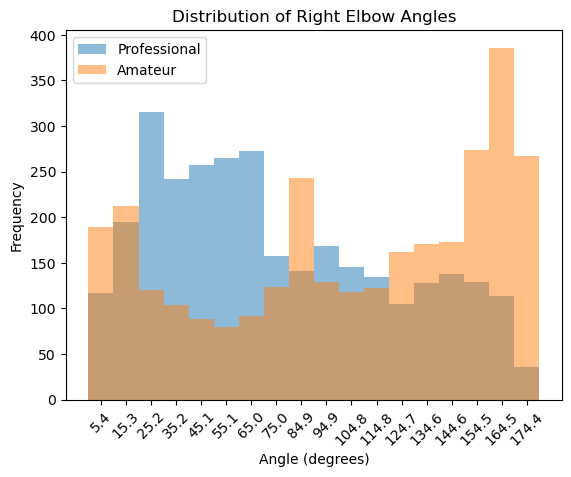

In [103]:
# Histograms for right elbow angle distributions
# Calculate histogram data
n, bins = np.histogram(pro_df['right_elbow_angles'], bins='auto')  # Adjust 'auto' if you want a specific bin number or range

# Plot professional histogram using calculated bins
plt.hist(pro_df['right_elbow_angles'], bins=bins, alpha=0.5, label='Professional')

# Plot amateur histogram using the same bins
plt.hist(amateur_df['right_elbow_angles'], bins=bins, alpha=0.5, label='Amateur')

# Calculate bin centers
bin_centers = 0.5 * (bins[:-1] + bins[1:])

# Set x-axis to bin centers
plt.xticks(bin_centers, labels=[f"{x:.1f}" for x in bin_centers], rotation=45)  # Formatting to 1 decimal place

# Add legend, title, and labels
plt.legend()
plt.title("Distribution of Right Elbow Angles")
plt.xlabel("Angle (degrees)")
plt.ylabel("Frequency")

# Show the plot
plt.show()

From the histogram, I can derive several insights about the distribution of right elbow angles during tennis serves for both professional and amateur players:

Professional Players:
- Peaks and Range: The histogram for professional players (in blue) shows significant peaks at around 32.5 degrees and another broader peak around 57.5 degrees. This multi-modal pattern indicates that professionals might adopt specific elbow angles during different phases of their serve, potentially aligning with different serving techniques or tactical variations.
- Consistency: The presence of distinct and sharp peaks, particularly the one at 32.5 degrees, suggests a high level of consistency in elbow positioning among professionals. This is likely a result of focused training to optimize elbow mechanics for enhanced serve efficiency and power.

Amateur Players:
- Primary Peak: The histogram for amateurs (in orange) exhibits a dominant peak at approximately 164.4 degrees, indicating a preference for a nearly fully extended elbow during the serve. This high degree of extension might be biomechanically less optimal, potentially leading to less control over the serve and increased risk of elbow strain.
- Distribution Characteristics: The amateur distribution is broader and extends across a range of lower angles as well, but with less frequency compared to the peak at 164.4 degrees. This suggests variability in technique, with less consistency and possibly less effective training in elbow positioning during serves.

Comparative Insights:
- Differences in Peak Locations: The stark contrast in peak locations highlights fundamental differences in technique. Professionals favor more acute elbow angles, which are likely more effective for controlling serve mechanics and power. In contrast, the amateur peak at a nearly fully extended elbow angle suggests a less controlled, more forceful swing, which might compromise precision and increase injury risk.
- Technique Variability and Optimization: The sharper peaks and lower angles in the professional histogram reflect a more optimized and consistent technique. Training amateurs to adopt similar elbow angles could potentially improve their serve effectiveness and reduce the risk of injuries.
- Overlap and Technique Transfer: The limited overlap between the professional and amateur distributions emphasizes different serving strategies. Teaching amateurs to reduce elbow extension during the serve and to utilize angles that are more biomechanically favorable could be beneficial.

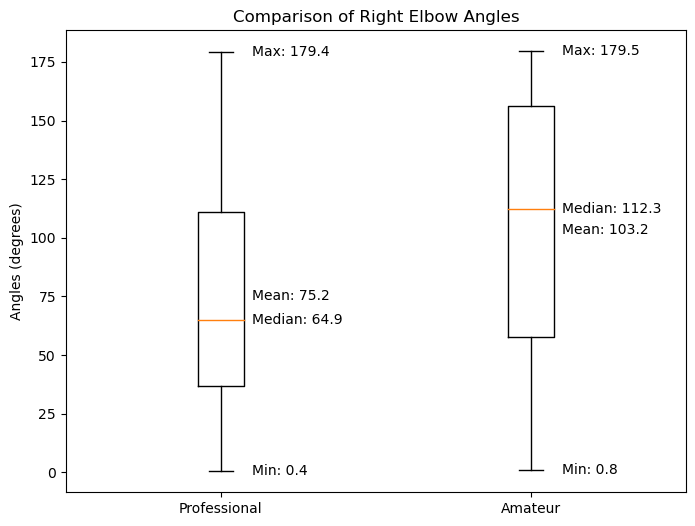

In [112]:
# Box plot for right elbow angles
# Data
pro_angles = pro_df['right_elbow_angles']
amateur_angles = amateur_df['right_elbow_angles']

# Box plot for right elbow angles
plt.figure(figsize=(8, 6))
plt.boxplot([pro_angles, amateur_angles], labels=['Professional', 'Amateur'])

# Calculate statistics
statistics = {
    'Professional': {
        'Mean': np.mean(pro_angles),
        'Median': np.median(pro_angles),
        'Max': np.max(pro_angles),
        'Min': np.min(pro_angles)
    },
    'Amateur': {
        'Mean': np.mean(amateur_angles),
        'Median': np.median(amateur_angles),
        'Max': np.max(amateur_angles),
        'Min': np.min(amateur_angles)
    }
}

# Annotate the plot with statistics
for i, label in enumerate(['Professional', 'Amateur']):
    plt.text(i + 1.1, statistics[label]['Mean'], f"Mean: {statistics[label]['Mean']:.1f}", 
             verticalalignment='center', horizontalalignment='left')
    plt.text(i + 1.1, statistics[label]['Median'], f"Median: {statistics[label]['Median']:.1f}", 
             verticalalignment='center', horizontalalignment='left')
    plt.text(i + 1.1, statistics[label]['Max'], f"Max: {statistics[label]['Max']:.1f}", 
             verticalalignment='center', horizontalalignment='left')
    plt.text(i + 1.1, statistics[label]['Min'], f"Min: {statistics[label]['Min']:.1f}", 
             verticalalignment='center', horizontalalignment='left')

plt.title('Comparison of Right Elbow Angles')
plt.ylabel('Angles (degrees)')
plt.show()

From the boxplots, I can derive several insights about the distribution of right elbow angles during tennis serves for both professional and amateur players:

1. Professional Players:
- Median: The median elbow angle is around 65 degrees. This lower median suggests that professionals typically use a more acute angle in their serving motion, which could indicate a technique optimized for power and control.
- Interquartile Range (IQR): The IQR, indicating the middle 50% of the data, spans approximately from 40 to 110 degrees. This narrower range demonstrates that professional players maintain a more consistent technique with less variability.
- Range: The overall range extends from about 0.5 degrees to 180 degrees. The wider total range compared to the IQR suggests that while most professionals are consistent, there are instances of both much tighter and somewhat more open elbow angles.

Amateur Players:
- Median: The median angle for amateurs is around 110 degrees, which is significantly higher than that of the professionals. This implies that amateurs typically serve with a more open elbow, which may not be as biomechanically efficient for power and control.
- Interquartile Range (IQR): The IQR for amateurs is from about 60 to 160 degrees, indicating a higher variability in their serving technique compared to professionals.
- Range: Extends from approximately 1 degrees to 180 degrees, showing a broad range that suggests a wide variance in technique among amateur players. This could reflect differing levels of skill, inconsistent training, or less focus on optimizing serving mechanics.

Comparative Insights
- Technique Consistency and Optimization: The comparison reveals that professionals tend to use a more consistent and refined serving technique, as indicated by a lower and tighter interquartile range of elbow angles. In contrast, amateurs display greater variability and generally less optimal elbow angles, which can affect the effectiveness and safety of their serves.
- Training Implications: The differences in elbow angle distributions highlight the potential benefits of targeted training for amateurs to reduce elbow angle during serves, potentially improving both performance and reducing the risk of injury.

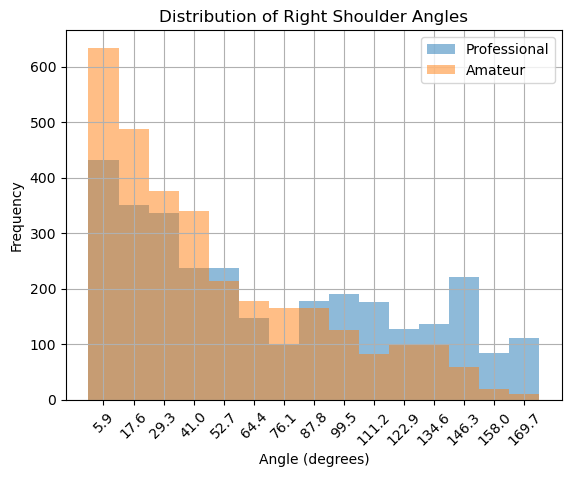

In [105]:
# Histograms for right shoulder angle distributions
# Calculate histogram data
n, bins = np.histogram(pro_df['right_shoulder_angles'], bins='auto')  # Adjust 'auto' if you want a specific bin number or range

# Plot professional histogram using calculated bins
plt.hist(pro_df['right_shoulder_angles'], bins=bins, alpha=0.5, label='Professional')

# Plot amateur histogram using the same bins
plt.hist(amateur_df['right_shoulder_angles'], bins=bins, alpha=0.5, label='Amateur')

# Calculate bin centers
bin_centers = 0.5 * (bins[:-1] + bins[1:])

# Set x-axis to bin centers
plt.xticks(bin_centers, labels=[f"{x:.1f}" for x in bin_centers], rotation=45)  # Formatting to 1 decimal place

# Add legend, title, and labels
plt.legend()
plt.title("Distribution of Right Shoulder Angles")
plt.xlabel("Angle (degrees)")
plt.ylabel("Frequency")

# Show the plot
plt.grid(True)
plt.show()

From the histogram, I can derive several insights about the distribution of right shoulder angles during tennis serves for both professional and amateur players:

Professional Players:
- Peak at Lower Angles: The histogram for professional players (in blue) shows a noticeable concentration around 23.4 to 32.1 degrees. This suggests that professionals frequently use these specific shoulder angles during their serves, which may be optimized for effective power delivery and control.
- Narrow Distribution: The distribution is relatively narrow, focusing predominantly within a range of about 10 to 40 degrees. This narrowness indicates consistency and precision in the shoulder angles used by professional players, likely a result of targeted training and technique refinement.

Amateur Players:
- Broad Distribution: In contrast, the histogram for amateurs (in orange) spans a much broader range of angles, starting from as low as 5 degrees up to about 150 degrees, with a noticeable peak around 64.1 to 73.8 degrees. This broad distribution signifies a high variability in shoulder angles, suggesting less consistency and possibly a less refined technique in their serves.
- Higher Angle Utilization: The peak at a higher angle compared to professionals might indicate a tendency among amateur players to over-rotate or use excessive shoulder angles, which could impact the serve's effectiveness and increase the risk of injury.

Comparative Insights:
- Difference in Peak Angles: The professional peak at a much lower angle suggests a more controlled and perhaps biomechanically advantageous shoulder positioning during serves. This positioning is likely focused on maximizing power and control with minimal risk of injury.
- Variability in Technique: The amateur players’ wider range and higher peak angle point to a greater diversity in playing styles and techniques, which might be less optimal. This could be an area for coaching focus, aiming to narrow the variability and shift the peak to lower angles to match more closely with professional techniques.
- Implications for Training: These insights can be valuable for coaches and trainers in developing targeted programs to help amateur players improve their serve techniques. Training could focus on achieving shoulder angles that are more consistent with those observed in professional players, potentially enhancing performance and reducing injury risks.

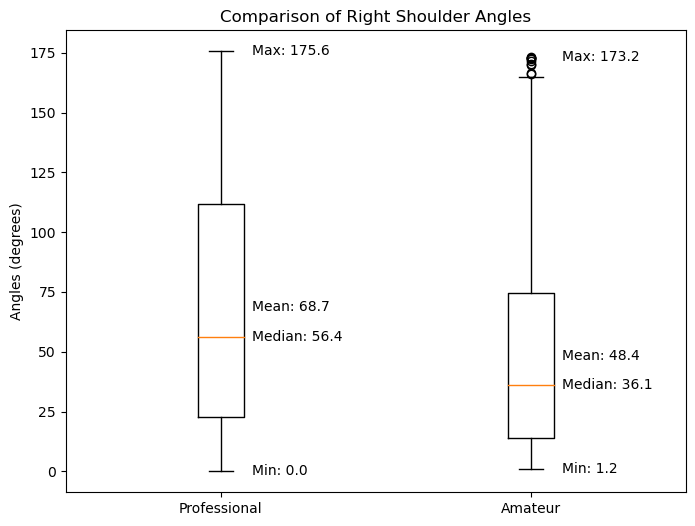

In [113]:
# Box plot for right shoulder angles
# Data
pro_angles_s = pro_df['right_shoulder_angles']
amateur_angles_s = amateur_df['right_shoulder_angles']

# Box plot for right shoulder angles
plt.figure(figsize=(8, 6))
plt.boxplot([pro_angles_s, amateur_angles_s], labels=['Professional', 'Amateur'])

# Calculate statistics
statistics = {
    'Professional_s': {
        'Mean': np.mean(pro_angles_s),
        'Median': np.median(pro_angles_s),
        'Max': np.max(pro_angles_s),
        'Min': np.min(pro_angles_s)
    },
    'Amateur_s': {
        'Mean': np.mean(amateur_angles_s),
        'Median': np.median(amateur_angles_s),
        'Max': np.max(amateur_angles_s),
        'Min': np.min(amateur_angles_s)
    }
}

# Annotate the plot with statistics
for i, label in enumerate(['Professional_s', 'Amateur_s']):
    plt.text(i + 1.1, statistics[label]['Mean'], f"Mean: {statistics[label]['Mean']:.1f}", 
             verticalalignment='center', horizontalalignment='left')
    plt.text(i + 1.1, statistics[label]['Median'], f"Median: {statistics[label]['Median']:.1f}", 
             verticalalignment='center', horizontalalignment='left')
    plt.text(i + 1.1, statistics[label]['Max'], f"Max: {statistics[label]['Max']:.1f}", 
             verticalalignment='center', horizontalalignment='left')
    plt.text(i + 1.1, statistics[label]['Min'], f"Min: {statistics[label]['Min']:.1f}", 
             verticalalignment='center', horizontalalignment='left')

plt.title('Comparison of Right Shoulder Angles')
plt.ylabel('Angles (degrees)')
plt.show()

From the boxplots, I can derive several insights about the distribution of right shoulder angles during tennis serves for both professional and amateur players:

Professional Players:
- Median and Mean: The median angle for professionals is 56.4 degrees, with a mean slightly higher at 68.7 degrees. The difference between the mean and median suggests a right-skewed distribution, indicating that while the central tendency for shoulder angles is around 56.4 degrees, there are enough higher values to pull the mean upwards.
- Range and Outliers: The range from the minimum value of 0 degrees to the maximum of 175.6 degrees shows considerable variability. The presence of outliers near the maximum value indicates some professionals utilize extremely high shoulder angles, although these are exceptions.
- Interquartile Range (IQR): The box, representing values from the 25th to the 75th percentile, is relatively extended, which suggests variability in the shoulder angles used during play, though the majority of data points are more concentrated around the median.

Amateur Players:
- Median and Mean: The median angle is 36.1 degrees, significantly lower than the professional median, with a mean of 48.4 degrees. This also suggests a distribution skewed to the right, with some amateurs using much higher angles.
- Range and Outliers: Amateurs also show a broad range from 1.2 to 173.2 degrees. The near similar maximum values for amateurs and professionals suggest that some amateurs can reach similar extremes in shoulder angles as professionals, albeit less consistently.
- Interquartile Range (IQR): The box for amateurs is narrower than that for professionals, indicating a tighter concentration of most data points around the median, despite the overall range being wide.

Comparative Insights:
- Median Angles: The lower median and mean for amateurs indicate that they typically use less extreme shoulder angles than professionals. This could reflect less aggressive or less optimized techniques.
- Variability: Both groups show considerable variability in shoulder angles, but the professional data tends to have a higher central tendency and more extended outliers, which might suggest more dynamic or varied techniques at high levels of play.
- Outliers and Extremes: The presence of high outliers in both groups indicates that both professional and amateur players sometimes adopt very high shoulder angles, although these are not the norm.

Practical Implications:
- Technique Training: The data suggests potential areas for technique improvement, especially for amateurs, who might benefit from training aimed at increasing shoulder angle usage to enhance serve power and effectiveness.
- Injury Prevention: Given the wide range of shoulder angles, especially at the upper extremes, there may also be a focus on ensuring that players use angles that do not predispose them to injury.

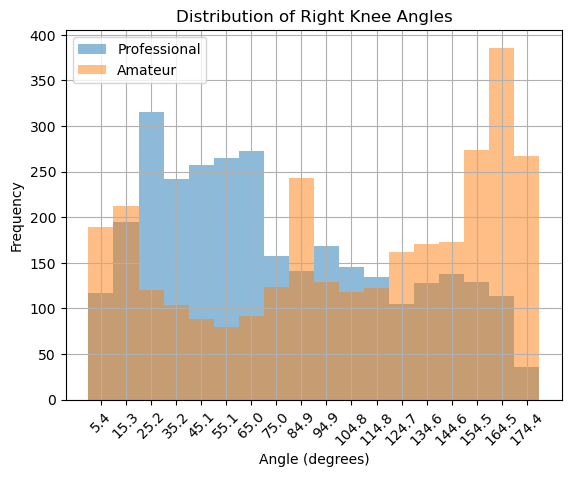

In [106]:
# Histograms for right knee angle distributions
# Calculate histogram data
n, bins = np.histogram(pro_df['right_knee_angles'], bins='auto')  # Adjust 'auto' if you want a specific bin number or range

# Plot professional histogram using calculated bins
plt.hist(pro_df['right_knee_angles'], bins=bins, alpha=0.5, label='Professional')

# Plot amateur histogram using the same bins
plt.hist(amateur_df['right_knee_angles'], bins=bins, alpha=0.5, label='Amateur')

# Calculate bin centers
bin_centers = 0.5 * (bins[:-1] + bins[1:])

# Set x-axis to bin centers
plt.xticks(bin_centers, labels=[f"{x:.1f}" for x in bin_centers], rotation=45)  # Formatting to 1 decimal place

# Add legend, title, and labels
plt.legend()
plt.title("Distribution of Right Knee Angles")
plt.xlabel("Angle (degrees)")
plt.ylabel("Frequency")

# Show the plot
plt.grid(True)
plt.show()

From the histogram, I can derive several insights about the distribution of right knee angles during tennis serves for both professional and amateur players:

Professional Players:
- Peaks: The histogram for professional players (in blue) exhibits primary peaks at approximately 32.5 degrees and a secondary peak at around 57.5 degrees. These specific peaks suggest that these angles are commonly preferred by professionals during their serves, which may offer biomechanical advantages in terms of stability and power generation.
- Consistency and Technique: The presence of these well-defined peaks implies a high degree of consistency in knee flexion among professionals, indicating a standardized and effective serving technique that has likely been refined through training.

Amateur Players:
- Primary Peak: The amateur histogram (in orange) shows a significant peak at around 164.4 degrees, which is considerably higher than any peak observed for the professionals. This suggests that amateur players commonly use a nearly fully extended knee during the serve.
- Range and Variation: Amateurs exhibit a broader distribution, spanning from lower angles similar to professionals, up to much higher angles. The range indicates variability in technique, which may reflect less precision and training in achieving optimal knee flexion during serves.

Comparative Insights:
- Difference in Optimal Angles: The primary knee flexion angles used by professionals (32.5 degrees and 57.5 degrees) contrast sharply with the predominant angle used by amateurs (around 164.4 degrees). This difference highlights a fundamental discrepancy in technique that might influence the effectiveness and safety of the serve.
- Technique Refinement: The sharper peaks and lower knee angles observed in professionals suggest more refined mechanics optimized for effective serve execution. In contrast, the high degree of knee extension seen in amateurs could be less effective and might pose a higher risk of strain or injury.
- Potential Training Focus: Given the stark differences in knee angle utilization, training programs for amateurs might benefit from focusing on achieving lower knee angles during serves. Emulating the professional technique could potentially enhance serve effectiveness and reduce injury risk.

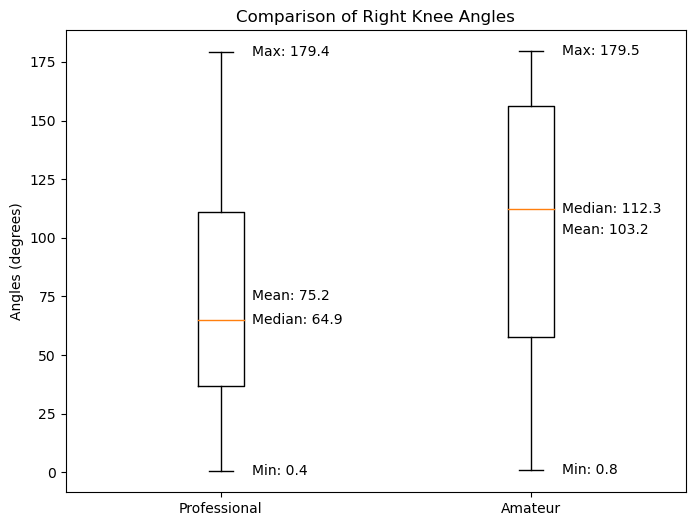

In [114]:
# Box plot for right knee angles
# Data
pro_angles_k = pro_df['right_knee_angles']
amateur_angles_k = amateur_df['right_knee_angles']

# Box plot for right knee angles
plt.figure(figsize=(8, 6))
plt.boxplot([pro_angles_k, amateur_angles_k], labels=['Professional', 'Amateur'])

# Calculate statistics
statistics = {
    'Professional_k': {
        'Mean': np.mean(pro_angles_k),
        'Median': np.median(pro_angles_k),
        'Max': np.max(pro_angles_k),
        'Min': np.min(pro_angles_k)
    },
    'Amateur_k': {
        'Mean': np.mean(amateur_angles_k),
        'Median': np.median(amateur_angles_k),
        'Max': np.max(amateur_angles_k),
        'Min': np.min(amateur_angles_k)
    }
}

# Annotate the plot with statistics
for i, label in enumerate(['Professional_k', 'Amateur_k']):
    plt.text(i + 1.1, statistics[label]['Mean'], f"Mean: {statistics[label]['Mean']:.1f}", 
             verticalalignment='center', horizontalalignment='left')
    plt.text(i + 1.1, statistics[label]['Median'], f"Median: {statistics[label]['Median']:.1f}", 
             verticalalignment='center', horizontalalignment='left')
    plt.text(i + 1.1, statistics[label]['Max'], f"Max: {statistics[label]['Max']:.1f}", 
             verticalalignment='center', horizontalalignment='left')
    plt.text(i + 1.1, statistics[label]['Min'], f"Min: {statistics[label]['Min']:.1f}", 
             verticalalignment='center', horizontalalignment='left')

plt.title('Comparison of Right Knee Angles')
plt.ylabel('Angles (degrees)')
plt.show()

From the boxplots, I can derive several insights about the distribution of right knee angles during tennis serves for both professional and amateur players:

Professional Players:
- Median and Mean: The median right knee angle is 64.9 degrees with a mean of 75.2 degrees, suggesting a somewhat right-skewed distribution but not excessively so. The majority of professional players use a moderately bent knee position, which is likely optimal for stability and power during play.
- Range and Outliers: The minimum knee angle is very close to fully extended (0.4 degrees), with the maximum almost fully bent (179.4 degrees). This wide range suggests that professionals use a very broad range of knee flexion, possibly adapting to different strokes and play styles.
- Interquartile Range (IQR): The box indicates that the middle 50% of angles are relatively compact compared to the total range, focusing around the median. This implies a consistent technique among most professionals within this range.

Amateur Players:
- Median and Mean: Amateurs show a median of 112.3 degrees and a mean of 103.2 degrees. These values are significantly higher than those of professionals, indicating that amateurs tend to play with more bent knees. The distribution is likely left-skewed.
- Range and Outliers: Similar to professionals, the range is nearly the full possible span, from just shy of straight (0.8 degrees) to nearly fully bent (179.5 degrees). This extensive range suggests variability in technique.
- Interquartile Range (IQR): The box, while indicating a generally higher knee angle, also shows significant variation within the amateur group, perhaps reflecting a lack of standardized technique or a greater diversity in playing style.

Comparative Insights:
- Differences in Knee Flexion: Amateurs tend to use more bent knee positions than professionals, which could suggest differences in how each group is trained or perhaps inefficiencies in amateurs’ movement that could be corrected for better performance.
- Technique Standardization: The narrower IQR for professionals suggests more standardized technique and training focused on optimizing knee angles for effective play. In contrast, the wider IQR and generally higher knee angles among amateurs might indicate a need for improved coaching to refine their knee flexion during strokes.
- Potential for Optimization: The data suggests that amateurs might benefit from training aimed at reducing knee flexion slightly to match the more moderate angles used by professionals, potentially improving their speed, power, and risk of injury.

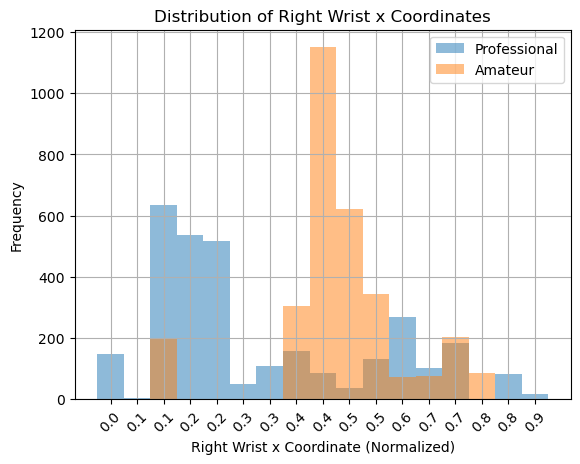

In [107]:
# Histograms for right wrist x position distributions
# Calculate histogram data
n, bins = np.histogram(pro_df['right_wrist_x'], bins='auto')  # Adjust 'auto' if you want a specific bin number or range

# Plot professional histogram using calculated bins
plt.hist(pro_df['right_wrist_x'], bins=bins, alpha=0.5, label='Professional')

# Plot amateur histogram using the same bins
plt.hist(amateur_df['right_wrist_x'], bins=bins, alpha=0.5, label='Amateur')

# Calculate bin centers
bin_centers = 0.5 * (bins[:-1] + bins[1:])

# Set x-axis to bin centers
plt.xticks(bin_centers, labels=[f"{x:.1f}" for x in bin_centers], rotation=45)  # Formatting to 1 decimal place

# Add legend, title, and labels
plt.legend()
plt.title("Distribution of Right Wrist x Coordinates")
plt.xlabel("Right Wrist x Coordinate (Normalized)")
plt.ylabel("Frequency")

# Show the plot
plt.grid(True)
plt.show()

From the histogram, I can derive several insights about the distribution of right wrist x-coordinates during tennis serves for both professional and amateur players:

Professional Players:
- Concentration at Lower Coordinates: The histogram for professional players (in blue) shows a significant concentration between approximately 0.1 and 0.3 on the x-coordinate scale. This indicates that professionals tend to keep their wrists closer to the body or more centrally aligned during play, which could be beneficial for control and power.
- Sharper Peaks: The distribution exhibits sharper peaks, suggesting that professionals have a more consistent and precise wrist positioning compared to amateurs. This consistency is likely due to rigorous training and technique refinement.

Amateur Players:
- Broader Distribution: In contrast, the histogram for amateurs (in orange) spans a wider range, with a notable peak around 0.5. This broader spread indicates a greater variability in wrist positioning, which might reflect less consistency and potentially less control over strokes.
- Peak at Higher Coordinates: The peak at a higher x-coordinate suggests that amateurs might extend their wrists further outward compared to professionals. This extended position could lead to a different playing style, possibly emphasizing reach over control.

Comparative Insights:
- Differences in Positioning: The clear difference in the concentration of wrist positions (more central for professionals versus more extended for amateurs) underscores different tactical or biomechanical approaches. Professionals possibly emphasize control and efficiency of movement, while amateurs may not have optimized their technique for maximum effectiveness.
- Implications for Technique Training: The insights from these distributions can be critical for coaching, where amateurs could be taught to adjust their wrist positions to more closely mirror the precise and controlled positions of professional players. Adjusting wrist positions could help in improving stroke effectiveness and consistency.
- Overlap and Distinct Ranges: The overlap in the distributions between 0.1 and 0.3 indicates common wrist positions during certain strokes or serves, yet the distinct higher range for amateurs might be targeted for specific technique corrections.

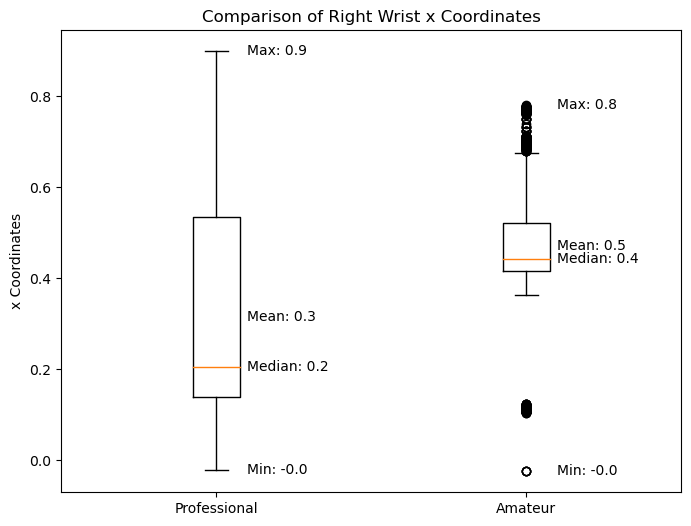

In [115]:
# Box plot for right wrist x coordinates
# Data
pro_x_coords = pro_df['right_wrist_x']
amateur_x_coords = amateur_df['right_wrist_x']

# Box plot for right wrist x coordinates
plt.figure(figsize=(8, 6))
plt.boxplot([pro_x_coords, amateur_x_coords], labels=['Professional', 'Amateur'])

# Calculate statistics
statistics = {
    'Professional_wx': {
        'Mean': np.mean(pro_x_coords),
        'Median': np.median(pro_x_coords),
        'Max': np.max(pro_x_coords),
        'Min': np.min(pro_x_coords)
    },
    'Amateur_wx': {
        'Mean': np.mean(amateur_x_coords),
        'Median': np.median(amateur_x_coords),
        'Max': np.max(amateur_x_coords),
        'Min': np.min(amateur_x_coords)
    }
}

# Annotate the plot with statistics
for i, label in enumerate(['Professional_wx', 'Amateur_wx']):
    plt.text(i + 1.1, statistics[label]['Mean'], f"Mean: {statistics[label]['Mean']:.1f}", 
             verticalalignment='center', horizontalalignment='left')
    plt.text(i + 1.1, statistics[label]['Median'], f"Median: {statistics[label]['Median']:.1f}", 
             verticalalignment='center', horizontalalignment='left')
    plt.text(i + 1.1, statistics[label]['Max'], f"Max: {statistics[label]['Max']:.1f}", 
             verticalalignment='center', horizontalalignment='left')
    plt.text(i + 1.1, statistics[label]['Min'], f"Min: {statistics[label]['Min']:.1f}", 
             verticalalignment='center', horizontalalignment='left')

plt.title('Comparison of Right Wrist x Coordinates')
plt.ylabel('x Coordinates')
plt.show()

From the boxplots, I can derive several insights about the distribution of right wrist x-coordinates during tennis serves for both professional and amateur players:

Professional Players:
- Median and Mean: The median x-coordinate is 0.2, with a mean of 0.3. This relatively close mean and median suggests a slightly right-skewed distribution, but generally, professionals have their wrists positioned closer to the center or left side of their bodies (assuming 0 is the far left and 1 is the far right).
- Range and Outliers: The range from a minimum slightly below 0 (perhaps indicating slight measurement errors or extreme positions) to a maximum of 0.9 shows significant variability in wrist positioning. However, the primary data (inside the box) suggest that most professional movements are concentrated around a narrower range.
- Interquartile Range (IQR): The box, representing the middle 50% of the data, is elongated, indicating variability within professional players, but concentrated around lower x-coordinates.

Amateur Players:
- Median and Mean: The median x-coordinate is 0.4, with a mean higher at 0.5, indicating a right-skewed distribution. Amateurs generally have their wrists further to the right side of their bodies compared to professionals.
- Range and Outliers: Similar to professionals, amateurs show a range that includes slightly below 0 to 0.8. Numerous outliers above the upper whisker suggest that a significant number of amateur players have extreme wrist positions that deviate from their typical range.
- Interquartile Range (IQR): The box for amateurs is also quite elongated and located further to the right than the professionals', which indicates not only higher wrist positions but also considerable variability within these positions.

Comparative Insights:
- Wrist Positioning: Professionals tend to keep their wrists closer to their body or more centrally aligned during play, which might be indicative of a more controlled and precise playing style. In contrast, amateurs have a wider spread and a tendency to extend their wrists further to the right, which may reflect less optimal biomechanics or a different style of stroke execution.
- Technique Implications: The positioning of the wrist can have significant implications for the type of shots played, their power, and their accuracy. The closer wrist positions of professionals might allow for greater control over the racket and finer adjustments during play.
- Coaching Points: For amateur players, focusing on mimicking the wrist positioning of professionals could improve their game by increasing control and reducing excessive wrist movements that could lead to errors or less effective strokes.

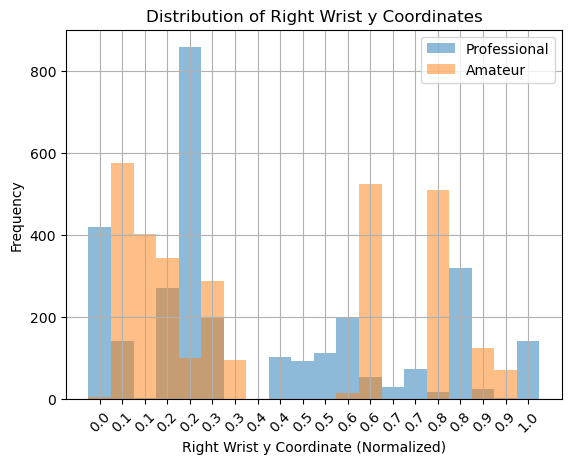

In [108]:
# Histograms for right wrist y position distributions
# Calculate histogram data
n, bins = np.histogram(pro_df['right_wrist_y'], bins='auto')  # Adjust 'auto' if you want a specific bin number or range

# Plot professional histogram using calculated bins
plt.hist(pro_df['right_wrist_y'], bins=bins, alpha=0.5, label='Professional')

# Plot amateur histogram using the same bins
plt.hist(amateur_df['right_wrist_y'], bins=bins, alpha=0.5, label='Amateur')

# Calculate bin centers
bin_centers = 0.5 * (bins[:-1] + bins[1:])

# Set x-axis to bin centers
plt.xticks(bin_centers, labels=[f"{x:.1f}" for x in bin_centers], rotation=45)  # Formatting to 1 decimal place

# Add legend, title, and labels
plt.legend()
plt.title("Distribution of Right Wrist y Coordinates")
plt.xlabel("Right Wrist y Coordinate (Normalized)")
plt.ylabel("Frequency")

# Show the plot
plt.grid(True)
plt.show()

From the histogram, I can derive several insights about the distribution of right wrist y-coordinates during tennis serves for both professional and amateur players:

Professional Players:
- Distinct Peaks: The histogram for professional players (in blue) shows clear peaks at approximately 0.2, 0.4, and 0.6. These peaks indicate preferred wrist positions at these specific normalized heights during strokes, likely corresponding to different phases of the swing or different types of strokes.
- Narrow Peaks: The peaks are relatively narrow, which suggests a high level of consistency and precision in wrist positioning. This characteristic is typical of players who have refined their techniques through rigorous training, aiming for optimal biomechanical efficiency and control.

Amateur Players:
- Broad Distribution: The amateur histogram (in orange) is less defined and shows a broader distribution with significant frequencies around 0.2, 0.4, and 0.7. The wider peaks and the presence of additional minor peaks suggest greater variability in wrist positioning during play.
- Higher Peaks at Higher y-Coordinates: The noticeable peak around 0.7 for amateurs, which is higher than most professional peaks, could indicate that amateurs often play with their wrists higher, possibly due to less controlled or less optimized stroke mechanics.

Comparative Insights:
- Vertical Position Variability: The significant difference in the spread of y-coordinate positions between professionals and amateurs underscores different levels of control and consistency. Professionals maintain a more controlled range of motion, enhancing precision and effectiveness.
- Implications for Training: These distributions highlight potential areas for improvement in amateur players. Training aimed at reducing variability and emulating the more consistent vertical wrist positions of professionals could help amateurs enhance their stroke effectiveness.
- Technique and Strategy: The different peaks may also reflect strategic differences in play style. Professionals might adjust their wrist height more deliberately to optimize stroke mechanics for various types of serves or returns, whereas amateurs might not be able to execute these adjustments as precisely.

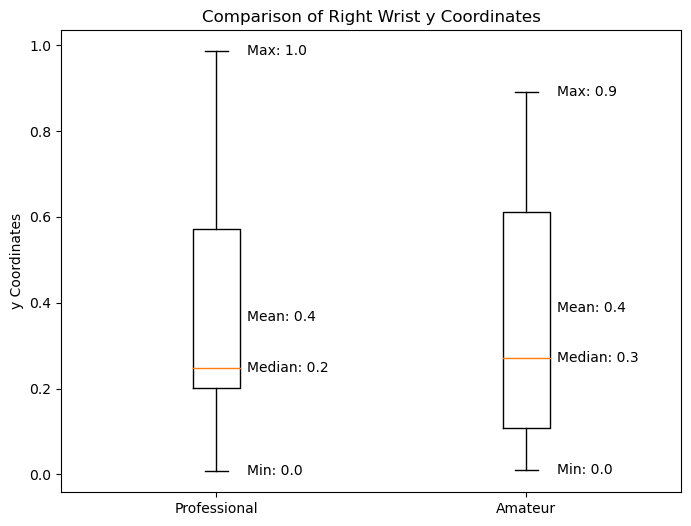

In [116]:
# Box plot for right wrist y coordinates
# Data
pro_y_coords = pro_df['right_wrist_y']
amateur_y_coords = amateur_df['right_wrist_y']

# Box plot for right wrist y coordinates
plt.figure(figsize=(8, 6))
plt.boxplot([pro_y_coords, amateur_y_coords], labels=['Professional', 'Amateur'])

# Calculate statistics
statistics = {
    'Professional_wy': {
        'Mean': np.mean(pro_y_coords),
        'Median': np.median(pro_y_coords),
        'Max': np.max(pro_y_coords),
        'Min': np.min(pro_y_coords)
    },
    'Amateur_wy': {
        'Mean': np.mean(amateur_y_coords),
        'Median': np.median(amateur_y_coords),
        'Max': np.max(amateur_y_coords),
        'Min': np.min(amateur_y_coords)
    }
}

# Annotate the plot with statistics
for i, label in enumerate(['Professional_wy', 'Amateur_wy']):
    plt.text(i + 1.1, statistics[label]['Mean'], f"Mean: {statistics[label]['Mean']:.1f}", 
             verticalalignment='center', horizontalalignment='left')
    plt.text(i + 1.1, statistics[label]['Median'], f"Median: {statistics[label]['Median']:.1f}", 
             verticalalignment='center', horizontalalignment='left')
    plt.text(i + 1.1, statistics[label]['Max'], f"Max: {statistics[label]['Max']:.1f}", 
             verticalalignment='center', horizontalalignment='left')
    plt.text(i + 1.1, statistics[label]['Min'], f"Min: {statistics[label]['Min']:.1f}", 
             verticalalignment='center', horizontalalignment='left')

plt.title('Comparison of Right Wrist y Coordinates')
plt.ylabel('y Coordinates')
plt.show()

From the boxplots, I can derive several insights about the distribution of right wrist y-coordinates during tennis serves for both professional and amateur players:

Professional Players:
- Median and Mean: The median y-coordinate is 0.2, while the mean is 0.4, indicating a distribution that is right-skewed. This suggests that while the majority of wrist positions are lower, there are significant occurrences where the wrist is positioned much higher.
- Range and Extremes: The range extends from the minimum at 0.0 (indicating a wrist position at the lowest vertical point) to the maximum at 1.0 (the highest vertical point possible), showing that professionals use the full vertical range during play.
- Interquartile Range (IQR): The IQR is focused towards the lower end of the range, but the significant length of the upper whisker indicates that there are frequent high wrist positions as well, possibly during different strokes or serving motions.

Amateur Players:
- Median and Mean: The median is 0.3, with a mean also at 0.4, suggesting a more symmetric distribution compared to professionals. Amateurs have their wrist positions spread more evenly across the lower and middle vertical range.
- Range and Extremes: Like professionals, amateurs also show a broad range from 0.0 to just below 1.0. However, the distribution's upper limit is slightly less than that of professionals.
- Interquartile Range (IQR): The box extends higher than that of professionals, and the median is positioned higher within the box, indicating that amateurs generally keep their wrists higher than professionals.

Comparative Insights:
- Lower vs. Higher Wrist Positioning: Professionals often have their wrists lower, which could suggest techniques that favor lower swings or specific types of strokes that require lower wrist positioning. Amateurs, having a higher median and a more centered box, might engage in techniques that involve higher swings.
- Distribution Symmetry: The more symmetric distribution around the median for amateurs could indicate less variability in the height at which they play, whereas the professional distribution suggests a specific technique involving low wrist positions, with occasional higher positions.
- Strategic Play and Technique: The use of the full vertical range more frequently by professionals could be indicative of a wider variety of strokes and more dynamic play, while the relatively higher and more even distribution among amateurs might suggest a need for refinement to optimize wrist positioning for better control and effectiveness in play.

Summary of the descriptive analysis

| Measurement                  | Group         | Median | Mean | Distribution Characteristics                                                                   | Additional Insights                                    |
|------------------------------|---------------|--------|------|-----------------------------------------------------------------------------------------------|-------------------------------------------------------|
| **Right Wrist X-Coordinates** | Professionals | 0.2    | 0.3  | Slightly right-skewed, concentrated around center. High variability in lower x-coordinates.  | Most data points are lower, indicating controlled movement. |
|                              | Amateurs      | 0.4    | 0.5  | Noticeably right-skewed, wrist positions further to the right. Outliers suggest extreme positions. | Wider spread may affect shot effectiveness.           |
| **Right Wrist Y-Coordinates** | Professionals | 0.2    | 0.4  | Right-skewed, positions mostly lower but capable of high reach.                               | Indicates a technique involving lower wrist positions.      |
|                              | Amateurs      | 0.3    | 0.3  | Symmetric across the vertical range, less reach to the top compared to professionals.         | Less variability in height during play.               |
| **Right Elbow Angles**        | Professionals | 65     | 75.2 | Narrower interquartile range (40 to 110 degrees), consistent technique with acute angles.     | Optimized for power, reflects consistent technique.   |
|                              | Amateurs      | 110    | 103.2 | Broader interquartile range (60 to 160 degrees), higher variability and less optimal biomechanics. | Indicates potential inefficiency in serve mechanics.  |
| **Right Shoulder Angles**     | Professionals | 56.4   | 68.7 | Distribution shows dynamic technique with high variability and some extreme values.            | Ability to vary technique dynamically.                |
|                              | Amateurs      | 36.1   | 48.4 | Less extreme angles, tighter concentration around the median despite a wide range.              | Suggests less aggressive techniques.                  |
| **Right Knee Angles**         | Professionals | 64.9   | 75.2 | Predominantly moderate flexion, indicating stable and powerful stance.                         | Conducive to effective play.                          |
|                              | Amateurs      | 112.3  | 103.2| Higher knee flexion, suggesting less efficient movement and a potential area for technique improvement. | Higher flexion may indicate inefficiencies.           |

### Comparative Insights:
- **Wrist Positioning:** Professionals maintain closer, central wrist alignments for controlled, precise strokes; amateurs show wider spread affecting shot effectiveness.
- **Elbow and Shoulder Angles:** Professionals exhibit lower and consistent elbow angles, optimized for power; amateurs show less optimal biomechanics with greater variability.
- **Knee Flexion:** Professionals use moderate knee flexion effectively; amateurs' higher flexion suggests inefficiencies that could benefit from coaching refinement.

### C. Time Series Analysis

Analyzing the plots of key metrics over time during the tennis serve can provide valuable insights into the biomechanics and dynamics of the motion. Here are some potential inferences that can be drawn from these plots:

1. Wrist Positions:
- Consistency of Motion: Check if the left and right wrist positions exhibit consistent patterns throughout the serve. Consistency may indicate good technique and repeatability in the serve motion.
- Timing of Motion: Observe the timing of wrist movements relative to key phases of the serve (e.g., backswing, forward swing, contact). Changes in wrist positions can indicate the initiation and progression of different stages of the serve.

In [54]:
# Function to filter data at specified intervals
def filter_data_at_intervals(df, interval=0.5):

    # Calculate indices for the specified interval
    step_size = int(interval * df['timestamps_seconds'].iloc[-1] / interval)  # Calculate step size based on total duration
    indices = np.arange(0, len(df), step_size)

    # Create a new dataframe for filtered data
    filtered_df = df.iloc[indices].copy()

    return filtered_df

# Apply the filtering function to both dataframes
pro_filtered_df = filter_data_at_intervals(pro_df)
amateur_filtered_df = filter_data_at_intervals(amateur_df)

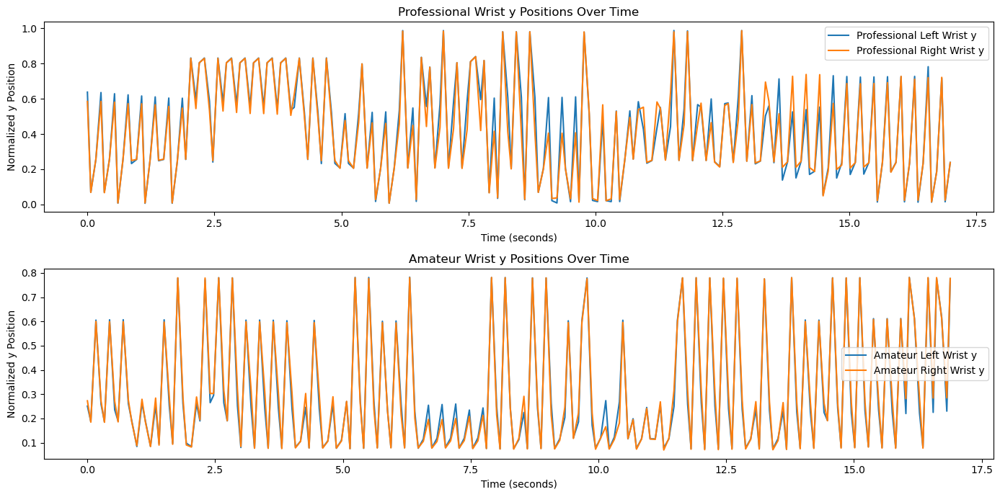

In [99]:
# Plotting left and right wrist y positions over time
plt.figure(figsize=(14, 7))

# Professional data
plt.subplot(2, 1, 1)
plt.plot(pro_filtered_df['timestamps_seconds'], pro_filtered_df['left_wrist_y'], label='Professional Left Wrist y')
plt.plot(pro_filtered_df['timestamps_seconds'], pro_filtered_df['right_wrist_y'], label='Professional Right Wrist y')
plt.title('Professional Wrist y Positions Over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Normalized y Position')
plt.legend()

# Amateur data
plt.subplot(2, 1, 2)
plt.plot(amateur_filtered_df['timestamps_seconds'], amateur_filtered_df['left_wrist_y'], label='Amateur Left Wrist y')
plt.plot(amateur_filtered_df['timestamps_seconds'], amateur_filtered_df['right_wrist_y'], label='Amateur Right Wrist y')
plt.title('Amateur Wrist y Positions Over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Normalized y Position')
plt.legend()

plt.tight_layout()
plt.show()

From the plots displaying the normalized y-positions of the left and right wrists over time during a tennis swing, these are the observations: 

For professional tennis players:
- The left and right wrist y-positions exhibit a clear oscillatory pattern, with smooth and periodic waves likely corresponding to different phases of the swing motion.
- The amplitudes of the waves are consistent, indicating a highly repeatable and technically refined swing technique among professionals.
- The left and right wrist y-positions are roughly out of phase, meaning when one wrist is at its peak position, the other is near its lowest point. This complementary motion is likely a key aspect of the professional swing biomechanics.
- The patterns are very regular and synchronized over the entire time period shown, suggesting excellent consistency in execution.

For amateur tennis players:
- The left and right wrist y-positions also show an oscillatory pattern, but with greater variability and irregularity compared to professionals.
- The amplitudes of the waves are less consistent, with some larger and smaller peaks, indicating greater variation in swing technique among amateurs.
- While there is a general out-of-phase relationship between the left and right wrists, it is less pronounced and less consistent than for professionals.
- The patterns are less regular and synchronized, with some periods of greater deviation from the expected oscillatory motion.

Overall, these plots highlight the higher degree of consistency, technical refinement, and synchronized biomechanics in the wrist motions of professional tennis players during their swings. Amateur players exhibit greater variability and less regularity in their wrist motions, likely resulting from differences in skill level, technique, and overall consistency in swing execution.

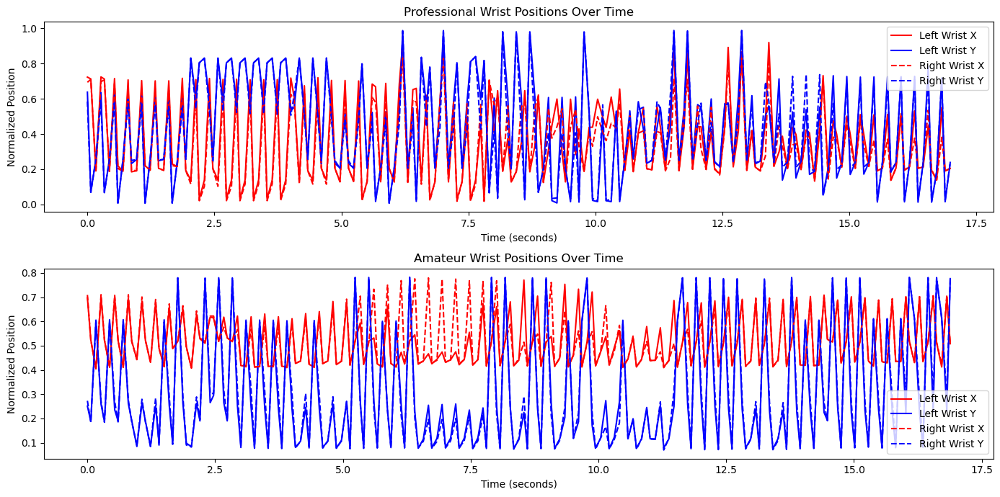

In [55]:
# Plotting left and right wrist positions
plt.figure(figsize=(14, 7))

# Professional data
plt.subplot(2, 1, 1)
plt.plot(pro_filtered_df['timestamps_seconds'], pro_filtered_df['left_wrist_positions'].apply(lambda x: x[0]), 'r-', label='Left Wrist X')
plt.plot(pro_filtered_df['timestamps_seconds'], pro_filtered_df['left_wrist_positions'].apply(lambda x: x[1]), 'b-', label='Left Wrist Y')
plt.plot(pro_filtered_df['timestamps_seconds'], pro_filtered_df['right_wrist_positions'].apply(lambda x: x[0]), 'r--', label='Right Wrist X')
plt.plot(pro_filtered_df['timestamps_seconds'], pro_filtered_df['right_wrist_positions'].apply(lambda x: x[1]), 'b--', label='Right Wrist Y')
plt.title('Professional Wrist Positions Over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Normalized Position')
plt.legend()

# Amateur data
plt.subplot(2, 1, 2)
plt.plot(amateur_filtered_df['timestamps_seconds'], amateur_filtered_df['left_wrist_positions'].apply(lambda x: x[0]), 'r-', label='Left Wrist X')
plt.plot(amateur_filtered_df['timestamps_seconds'], amateur_filtered_df['left_wrist_positions'].apply(lambda x: x[1]), 'b-', label='Left Wrist Y')
plt.plot(amateur_filtered_df['timestamps_seconds'], amateur_filtered_df['right_wrist_positions'].apply(lambda x: x[0]), 'r--', label='Right Wrist X')
plt.plot(amateur_filtered_df['timestamps_seconds'], amateur_filtered_df['right_wrist_positions'].apply(lambda x: x[1]), 'b--', label='Right Wrist Y')
plt.title('Amateur Wrist Positions Over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Normalized Position')
plt.legend()

plt.tight_layout()
plt.show()

From the plots displaying the normalized x and y positions of both the left and right wrists over time during a tennis swing, these are the observations: 

Professional Tennis Player
1. Wrist Movement Patterns:
- The graph shows distinct and regular patterns in both the X (red) and Y (blue) coordinates for left (solid lines) and right (dashed lines) wrists.
- The movements of the left wrist and the right wrist are clearly defined, with consistent oscillation indicating repetitive and controlled motion during play. This suggests a high degree of consistency and control in the player's movements.
2. X vs. Y Movements:
- The X-coordinate movements (horizontal) for both wrists show regular fluctuations, which might represent lateral movements across the tennis court or adjustments in positioning relative to the net.
- The Y-coordinate movements (vertical) are similarly regular, likely reflecting the vertical motion of the wrists during swings and hits, including the serve and volley strokes.
3. Consistency and Technique:
- The regularity and repeatability of the patterns likely indicate a well-developed and consistent technique. Such patterns are typical of professional players who have refined their movements through extensive practice and coaching.

Amateur Tennis Player
1. Wrist Movement Patterns:
- The patterns here are less regular and more erratic compared to the professional’s graphs. This variability suggests less control and consistency in stroke execution.
- There appears to be more abrupt changes in the wrist positions, particularly in the Y-coordinate, which might indicate inconsistent contact points with the ball or variability in swing mechanics.
2. X vs. Y Movements:
- The X-coordinate movements show some periodicity but are less smooth and more interrupted, which could indicate less efficient movement across the court or difficulty in maintaining position during play.
- The Y-coordinate movements are more variable and less predictable, with greater amplitude in fluctuations. This could reflect a less stable or less consistent swing technique, potentially leading to more errors or less effective strokes.
3. Technique Refinement Needs:
- The greater variability and lack of smooth, repetitive patterns in the amateur's movements suggest areas where technique could be improved. Coaching aimed at stabilizing and standardizing their swing mechanics could potentially make their play more effective.

Overall Interpretation
- Comparison: The comparison between the professional and amateur graphs clearly illustrates the differences in skill level, with the professional showing more controlled and consistent wrist movements. In contrast, the amateur exhibits more erratic and variable motion, indicating less refined technique.
- Training Insights: These plots could be used by coaches to highlight specific areas of improvement, particularly in stabilizing and refining the wrist movements during different strokes for the amateur player.

2. Joint Angles (Elbow, Shoulder, Knee):
- Range of Motion: Analyze the range of motion for each joint angle during the serve. A wide range of motion may indicate flexibility and efficiency in generating power and accuracy.
- Joint Coordination: Look for coordinated movements between different joints. For example, the timing and sequencing of the elbow, shoulder, and knee angles can indicate the kinetic chain and transfer of energy throughout the serve motion.
- Stability and Control: Evaluate the stability and control of joint angles over time. Consistently maintained angles may suggest good control and technique, while fluctuations or erratic movements could indicate instability or technical deficiencies.

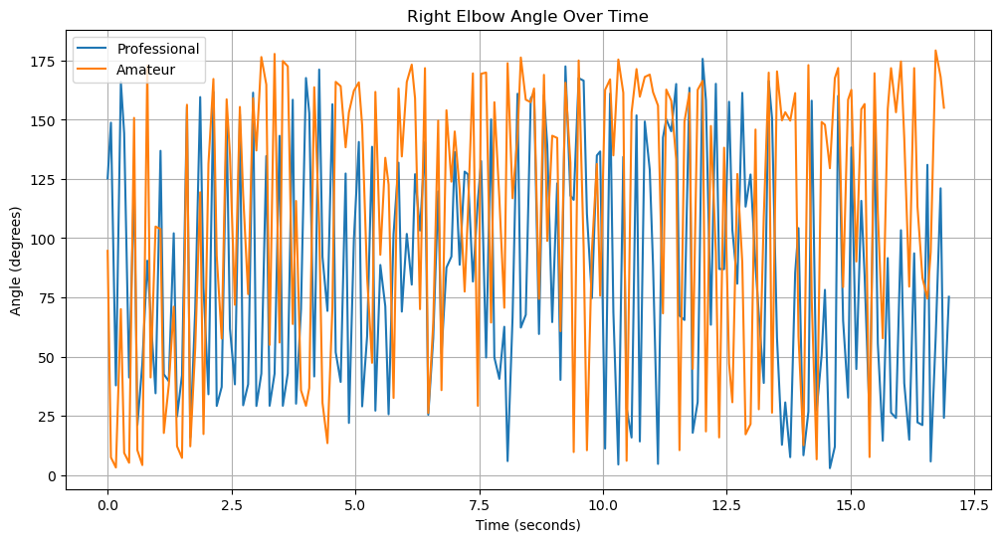

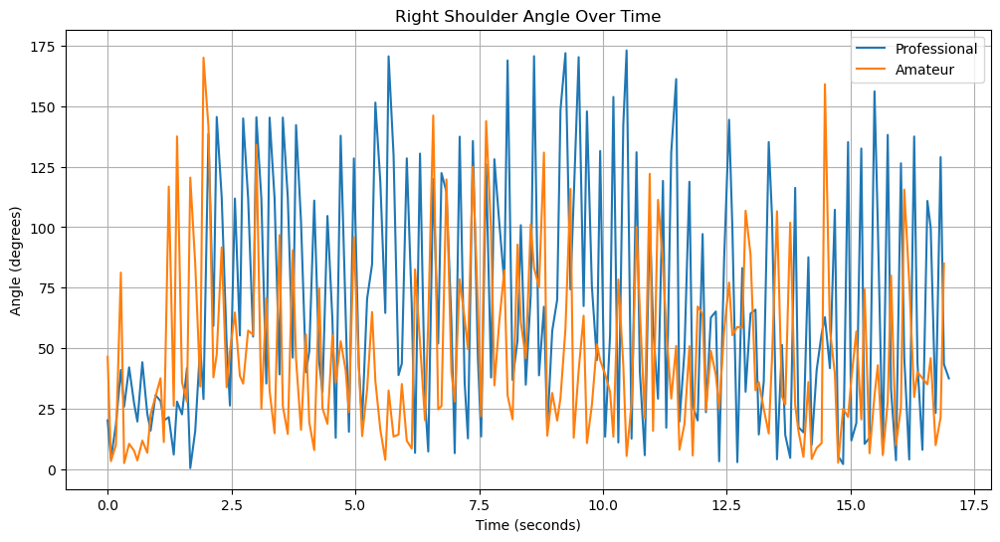

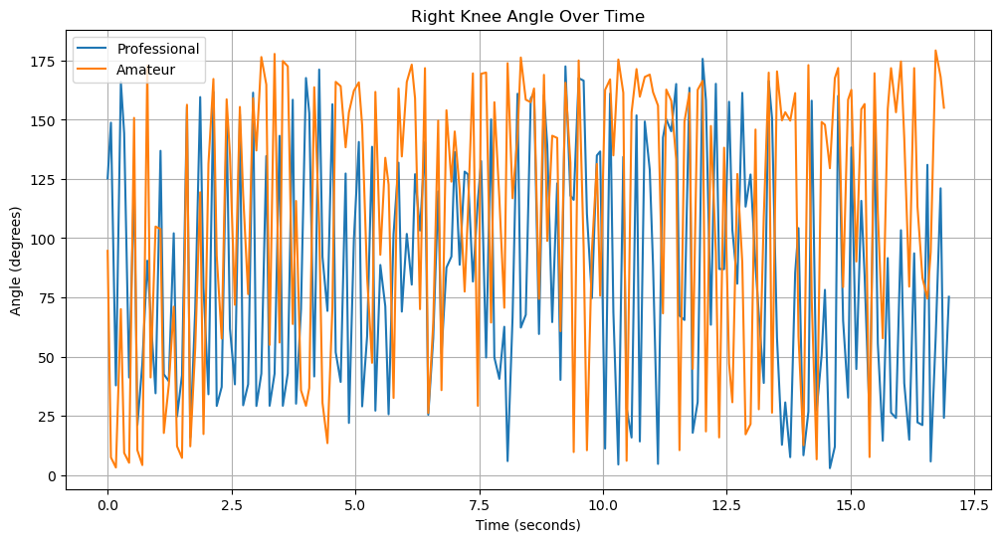

In [64]:
# Define the plot for each joint angle
def plot_joint_angles(df1, df2, title, ylabel, joint_angle, time_label='Time (seconds)'):
    plt.figure(figsize=(12, 6))
    plt.plot(df1['timestamps_seconds'], df1[joint_angle], label='Professional')
    plt.plot(df2['timestamps_seconds'], df2[joint_angle], label='Amateur')
    plt.title(f'{title} Over Time')
    plt.xlabel(time_label)
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True)
    plt.show()

# Plotting each angle on separate graphs
plot_joint_angles(pro_filtered_df, amateur_filtered_df, 'Right Elbow Angle', 'Angle (degrees)', 'right_elbow_angles')
plot_joint_angles(pro_filtered_df, amateur_filtered_df, 'Right Shoulder Angle', 'Angle (degrees)', 'right_shoulder_angles')
plot_joint_angles(pro_filtered_df, amateur_filtered_df, 'Right Knee Angle', 'Angle (degrees)', 'right_knee_angles')

From the plot displaying the displaying the `right elbow angle over time` during a tennis serve, these are the observations: 

Professional Tennis Player
1. Elbow Movement Patterns:
- The graph shows more consistent and smooth changes in the right elbow angle, depicted by the blue line. The angle changes reflect controlled and deliberate motions, indicating a high degree of mastery in managing the elbow's movement during the serve.
- The consistency in the elbow's angle suggests a well-practiced and technically refined serve, maintaining optimal biomechanics for effective play.
2. Angle Stability:
- The right elbow maintains a relatively stable range, primarily staying within a narrower angle window. This stability is crucial for delivering powerful and accurate serves, as it indicates a controlled release of energy.
3. Technique Consistency:
- The uniformity of the elbow angles over repeated serves points to a refined and consistent serving technique. Such regularity is typical of professional players who have honed their skills through extensive training and coaching.

Amateur Tennis Player
1. Elbow Movement Patterns:
- The plot for the amateur, represented by the orange line, shows more erratic and fluctuating elbow angles. This variability suggests less control and consistency in the elbow's motion during the serve.
- The amateur's elbow movements are less defined and exhibit abrupt changes, potentially indicating inconsistency in serve mechanics and less optimal biomechanical execution.
2. Angle Variability:
- The elbow angle of the amateur spans a broader range, showing significant fluctuations that could contribute to less effective and less predictable serves.
3. Technique Refinement Needs:
- The greater inconsistency and erratic patterns in the amateur's elbow movements highlight areas for potential improvement. Coaching focused on stabilizing and standardizing elbow movement during the serve could enhance effectiveness and accuracy.

Overall Interpretation
- Comparison: The comparison between the professional and amateur clearly illustrates the differences in skill level and biomechanical control. The professional demonstrates a controlled, stable, and consistent elbow movement, essential for high-performance serves. In contrast, the amateur shows more erratic and less controlled elbow motion, indicating a less refined technique.
- Training Insights: These plots could be utilized by coaches to pinpoint specific areas of improvement for the amateur player, particularly focusing on achieving a more stable and controlled elbow angle during the serve. This could lead to more consistent and powerful serves.

From the plot displaying the displaying the `right shoulder angle over time` during a tennis serve, these are the observations:

Professional Tennis Player
1. Shoulder Movement Patterns:
- The graph shows more consistent and controlled variations in the right shoulder angle, represented by the blue line. The shoulder angle changes are relatively smooth and maintain within certain limits, indicating controlled and precise movements.
- Such consistent movement patterns suggest a high degree of mastery in shoulder positioning during the serve, which is critical for effective power delivery and accuracy.
2. Angle Stability:
- The professional maintains the shoulder angle mostly within a moderate range, avoiding extreme spikes. This stability helps in consistent energy transfer during the serve and contributes to a reliable serve technique.
3. Technique Consistency:
- The professional's shoulder movements exhibit less extreme variability, which likely correlates with a refined technique honed through extensive practice. The consistency in shoulder angle directly impacts the precision and power of the serve, reflecting a well-trained serving motion.

Amateur Tennis Player
1. Shoulder Movement Patterns:
- The amateur's right shoulder angle, shown by the orange line, is more erratic with significant fluctuations. These variations are indicative of less control and precision in shoulder movement during the serve.
- The more pronounced and abrupt changes in the shoulder angle suggest an inconsistency in serve mechanics, which could lead to less effective serves.
2. Angle Variability:
- The shoulder angle of the amateur spans a broader range, with some angles dropping quite low and others peaking suddenly. This lack of control might result in less predictable and potentially less powerful serves.
3. Technique Refinement Needs:
- The erratic nature and high variability in the amateur's shoulder movements underscore areas for improvement. Coaching should focus on stabilizing and controlling shoulder movements to develop a more consistent and effective serving technique.

Overall Interpretation
- Comparison: The comparison between the professional and amateur clearly shows more controlled and consistent shoulder movements in the professional player. This control is crucial for delivering powerful and accurate serves. In contrast, the amateur exhibits greater variability and less precision, indicating a need for technique refinement.
- Training Insights: The data from these plots could be used by coaches to target specific improvements in the amateur's shoulder control during the serve. Enhancing stability and consistency in this area could lead to significant improvements in serve effectiveness and reliability.

From the plot displaying the displaying the `right knee angle over time` during a tennis serve, these are the observations:

Professional Tennis Player
1. Knee Movement Patterns:
- The graph shows a more stable and controlled variation in the right knee angle, represented by the blue line. The professional exhibits smooth transitions in knee bending and extension, which is critical for maintaining balance and generating power during the serve.
- The consistency and control in knee movements suggest a well-optimized technique that contributes to both the power and precision of the serve.
2. Angle Stability:
- The professional's knee angles are generally maintained within a moderate range, avoiding extreme bends or rapid extensions. This controlled modulation of the knee angle helps in maintaining an effective and stable base from which to execute powerful serves.
3. Technique Consistency:
- The consistency observed in the knee angle changes indicates a well-practiced technique, suggesting that the professional has developed a reliable kinetic chain from the ground up, essential for effective serve mechanics.

Amateur Tennis Player
1. Knee Movement Patterns:
- The amateur's right knee angle, shown by the orange line, displays greater variability and less control. The fluctuations are more pronounced and less rhythmic, indicating a lack of consistency in the use of the knee during serve mechanics.
- These erratic movements could lead to unstable base support during the serve, affecting both power and accuracy.
2. Angle Variability:
- The amateur demonstrates a wider range of knee angles, including deeper bends and quicker extensions. This lack of control may not only affect the serve's power but also increase the risk of inconsistency and potential injury.
3. Technique Refinement Needs:
- The high variability and less controlled knee movements highlight areas for improvement. Coaching should focus on stabilizing the knee movements by teaching the amateur player to maintain a more consistent knee bend during the serve, which could enhance both the effectiveness and safety of the serve.

Overall Interpretation
- Comparison: The comparison between the professional and amateur reveals significant differences in knee control during the serve. The professional exhibits more controlled and consistent knee movements, which are crucial for a powerful and accurate serve. In contrast, the amateur shows greater variability and erratic movements, indicating a need for technique improvement.
- Training Insights: These plots provide a basis for coaches to develop targeted training programs aimed at improving the amateur player's knee stability and consistency during the serve. This could lead to improvements in serve effectiveness and overall play consistency.

Summary for the time series analysis

| Aspect                           | Professional Players                                                                                      | Amateur Players                                                                                           |
|----------------------------------|----------------------------------------------------------------------------------------------------------|-----------------------------------------------------------------------------------------------------------|
| **Y-Positions of Wrists**        | Smooth, periodic oscillations with consistent amplitude. Complementary and synchronized wrist movements. | Oscillatory with greater variability and irregular amplitude. Less pronounced phase relationship.         |
| **X and Y Positions of Wrists**  | Distinct, regular patterns in both horizontal and vertical movements, indicating precise stroke execution.| Erratic and less defined patterns, especially in vertical movements. Greater variability and less control.|
| **Right Elbow Angle**            | Smooth, consistent changes in angle, demonstrating controlled and precise motions for optimal serves.     | Fluctuating and erratic movements, indicating less biomechanical efficiency and control.                   |
| **Right Shoulder Angle**         | Controlled, consistent movements within a moderate range, supporting efficient power transfer.            | Significant fluctuations, suggesting inconsistencies that could impact serve effectiveness.               |
| **Right Knee Angle**             | Stable and controlled knee movements, maintaining an effective base for powerful and accurate serves.     | Greater variability and less controlled movements, suggesting a less stable base for effective serves.     |

### D. Correlation Analysis

Relationships between the features: scatterplot of wrist positions and right elbow angles
- Exploration of Biomechanical Relationships:
    - Joint Movements: In a tennis serve, both wrist positions and elbow angles play crucial roles in generating power and control. Exploring their relationship can provide insights into the coordination and synchronization of these joint movements during the serve motion.
    - Kinetic Chain: The tennis serve involves a kinetic chain of movements, where actions at one joint (e.g., wrist) can influence movements at other joints (e.g., elbow). By examining the relationship between wrist positions and elbow angles, we can gain insights into how energy is transferred and coordinated along the kinetic chain.
- Identification of Patterns and Trends:
    - Correlation: A scatter plot allows us to visually assess if there is any correlation or association between wrist positions and elbow angles. Patterns in the scatter plot, such as clusters or trends, may indicate coordinated movements or biomechanical dependencies between the two metrics.
    - Dynamics of Motion: Changes in wrist positions may correspond to adjustments in elbow angles and vice versa. By plotting these metrics together, we can observe how they vary in relation to each other over the course of the serve motion.
- Detection of Anomalies or Outliers:
    - Biomechanical Anomalies: Anomalies or outliers in the scatter plot may highlight instances where the coordination between wrist positions and elbow angles deviates from the expected biomechanical norms. These deviations could signify technical errors, inefficiencies, or potential areas for improvement in the serve technique.
    - Inconsistencies: Inconsistencies or irregularities in the scatter plot may indicate variability or instability in the relationship between wrist positions and elbow angles. Identifying such inconsistencies can guide further analysis to understand the underlying factors contributing to these variations.

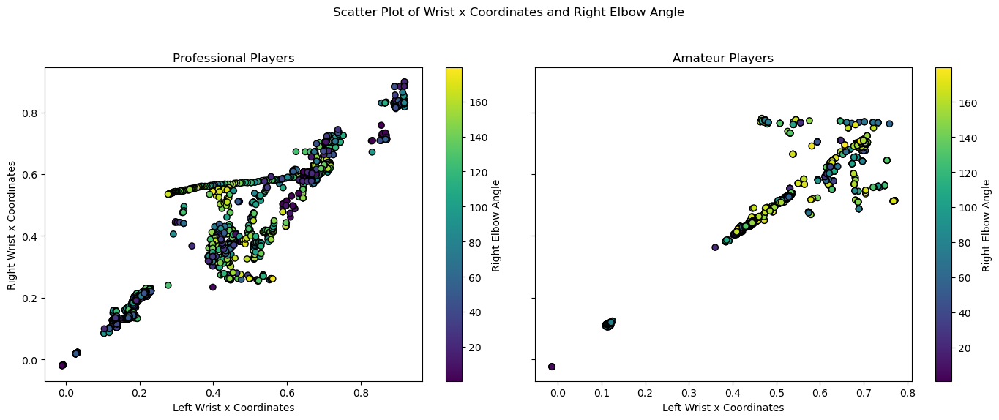

In [95]:
# Create a figure with subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)  # Sharey ensures that both plots have the same y-axis scale

# Plot for Professional Players
sc1 = axes[0].scatter(pro_df['left_wrist_x'], pro_df['right_wrist_x'], c=pro_df['right_elbow_angles'], cmap='viridis', edgecolor='k')
axes[0].set_title('Professional Players')
axes[0].set_xlabel('Left Wrist x Coordinates')
axes[0].set_ylabel('Right Wrist x Coordinates')
# Add a colorbar to the first subplot
fig.colorbar(sc1, ax=axes[0], label='Right Elbow Angle')

# Plot for Amateur Players
sc2 = axes[1].scatter(amateur_df['left_wrist_x'], amateur_df['right_wrist_x'], c=amateur_df['right_elbow_angles'], cmap='viridis', edgecolor='k')
axes[1].set_title('Amateur Players')
axes[1].set_xlabel('Left Wrist x Coordinates')
# Adding a colorbar to the second subplot for consistency
fig.colorbar(sc2, ax=axes[1], label='Right Elbow Angle')

plt.suptitle('Scatter Plot of Wrist x Coordinates and Right Elbow Angle')
plt.grid(False)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the layout to make room for the suptitle
plt.show()

From the scatterplots of the wrist x positions and the right elbow angles which display the relationship between the left wrist x-coordinates (x-axis) and the right wrist x-coordinates (y-axis) and the color of each point representing the corresponding right elbow angle, with a colorbar on the right showing the mapping of colors to angles, these are the observations:

For professional tennis players:
- There is a clear positive correlation between the left and right wrist x-coordinates, forming a distinct diagonal pattern.
- The points are more densely clustered, suggesting a more consistent technique among professional players.
- The range of right elbow angles (indicated by the color scale) is broader, with angles ranging from around 20 to 160 degrees.
- Higher right elbow angles (warmer colors) tend to correspond to larger wrist x-coordinate values, indicating a relationship between elbow angle and wrist position.

For amateur tennis players:
- There is also a positive correlation between left and right wrist x-coordinates, but the pattern is less well-defined and more scattered.
- The points are more spread out, suggesting greater variability in technique among amateur players.
- The range of right elbow angles is narrower, mostly between 60 and 120 degrees.
- The relationship between elbow angle and wrist position is less clear, with a wider spread of colors across the range of x-coordinates.

Overall, the scatter plots reveal tighter clustering and a more distinct pattern for professional players, suggesting a more consistent and technically refined swing motion. The amateur players exhibit greater variability in their wrist and elbow positions, which could be due to differences in skill level, technique, or other factors.

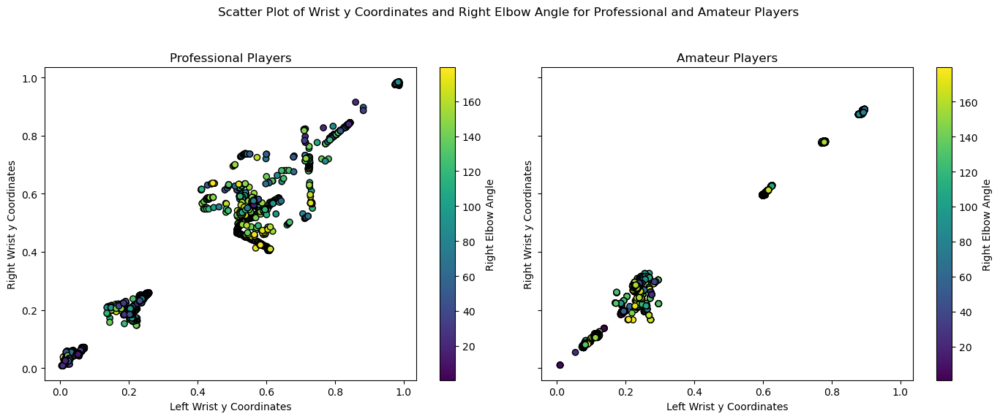

In [96]:
# Create a figure with subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True, sharex=True)  # Share both x and y to ensure direct comparability

# Professional Players Scatter Plot
scatter_pro = axes[0].scatter(pro_df['left_wrist_y'], pro_df['right_wrist_y'], c=pro_df['right_elbow_angles'], cmap='viridis', edgecolor='k')
axes[0].set_title('Professional Players')
axes[0].set_xlabel('Left Wrist y Coordinates')
axes[0].set_ylabel('Right Wrist y Coordinates')
# Adding a colorbar to the plot for professionals
cbar_pro = fig.colorbar(scatter_pro, ax=axes[0], label='Right Elbow Angle')

# Amateur Players Scatter Plot
scatter_amateur = axes[1].scatter(amateur_df['left_wrist_y'], amateur_df['right_wrist_y'], c=amateur_df['right_elbow_angles'], cmap='viridis', edgecolor='k')
axes[1].set_title('Amateur Players')
axes[1].set_xlabel('Left Wrist y Coordinates')
axes[1].set_ylabel('Right Wrist y Coordinates')
# Adding a colorbar to the plot for amateurs
cbar_amateur = fig.colorbar(scatter_amateur, ax=axes[1], label='Right Elbow Angle')

plt.suptitle('Scatter Plot of Wrist y Coordinates and Right Elbow Angle for Professional and Amateur Players')
plt.grid(False)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the layout to make room for the suptitle
plt.show()

From the scatterplots of the wrist y positions and the right elbow angles which display the relationship between the left wrist y-coordinates (x-axis) and the right wrist y-coordinates (y-axis) and the color of each point representing the corresponding right elbow angle, with a colorbar on the right showing the mapping of colors to angles, these are the observations:

For professional tennis players:
- There appears to be a weak negative correlation between the left and right wrist y-coordinates, with most points concentrated in the lower-left quadrant.
- The points are more clustered together, suggesting a more consistent technique among professionals.
- The range of right elbow angles (indicated by the color scale) is broad, spanning from around 20 to 160 degrees.
- Higher right elbow angles (warmer colors) tend to correspond to lower right wrist y-coordinate values and higher left wrist y-coordinate values.

For amateur tennis players:
- There is no clear correlation or distinct pattern between the left and right wrist y-coordinates, with points scattered across the plot area.
- The points are more spread out, indicating greater variability in technique among amateur players.
- The range of right elbow angles is narrower compared to professionals, mostly between 60 and 120 degrees.
- The relationship between elbow angle and wrist y-coordinates is less evident, with a wider distribution of colors across the plot.

Overall, the scatter plots reveal a more consistent pattern and tighter clustering for professional players, suggesting a more technically refined swing motion, particularly in the vertical (y-axis) wrist positions. Amateur players exhibit greater variability in their wrist y-coordinates and elbow angles, which could be attributed to differences in skill level, technique, or other factors. The negative correlation between wrist y-coordinates for professionals may indicate specific biomechanical patterns in their swing.

A detailed correlation analysis to understand the relationships between various biomechanical aspects of tennis serves for both professional and amateur players. Specifically, we focus on the correlations between the right elbow angles and the x and y coordinates of the right wrist. These metrics were chosen because they play crucial roles in the mechanics of a tennis serve, influencing both the power and accuracy of the serve.

For the heatmap, it includes the following features: 
Correlation Matrix Calculation: We calculate the Pearson correlation coefficients among these variables to quantify the strength and direction of the linear relationships between them.
Heatmap Visualization: The correlation matrices are visualized using heatmaps, allowing for an intuitive graphical representation of the correlations. This visualization helps in quickly identifying strong correlations which might warrant further investigation or targeted training interventions.

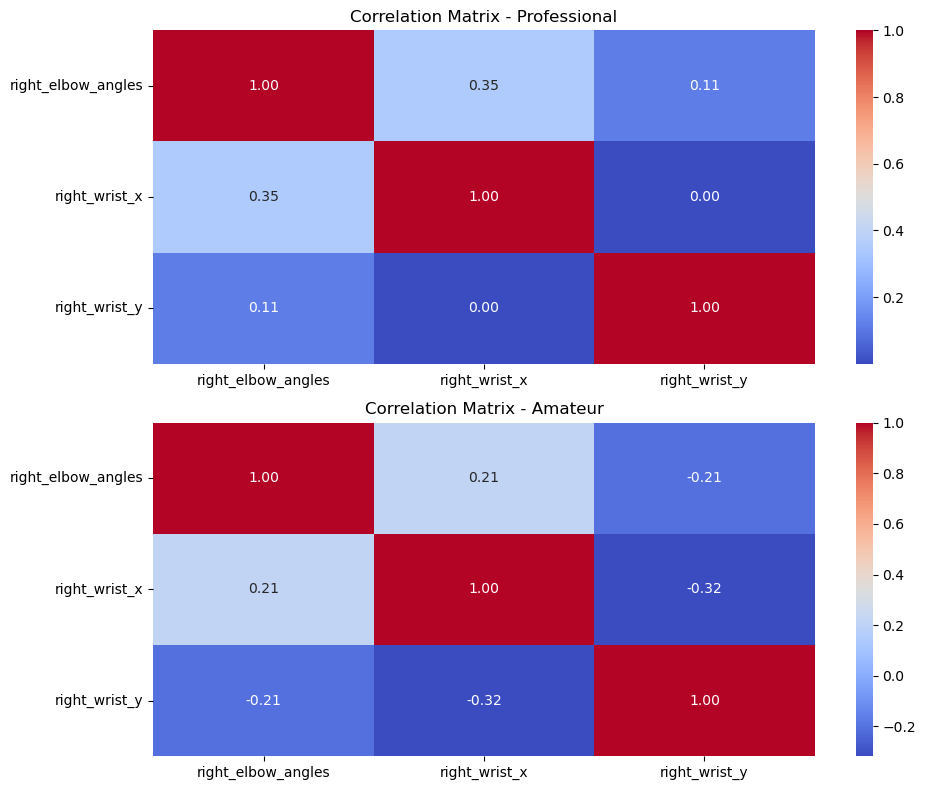

In [86]:
# Plotting correlation heatmap for Professional Players
plt.figure(figsize=(10, 8))
plt.subplot(2, 1, 1)  # This allows two plots: one for professional, one for amateur
sns.heatmap(pro_df[['right_elbow_angles', 'right_wrist_x', 'right_wrist_y']].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix - Professional')

# Plotting correlation heatmap for Amateur Players
plt.subplot(2, 1, 2)
sns.heatmap(amateur_df[['right_elbow_angles', 'right_wrist_x', 'right_wrist_y']].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix - Amateur')

plt.tight_layout()
plt.show()

From the heatmaps for the correlation of the right wrist positions and the right elbow angles, these are the observations: 

For the professional tennis players:
- right_elbow_angles has a moderate positive correlation of 0.35 with right_wrist_x.
- right_elbow_angles has a weak positive correlation of 0.11 with right_wrist_y.
- right_wrist_x and right_wrist_y have no correlation (0.0).

For the amateur tennis players:
- right_elbow_angles has a weak positive correlation of 0.21 with right_wrist_x.
- right_elbow_angles has a weak negative correlation of -0.21 with right_wrist_y.
- right_wrist_x has a moderate negative correlation of -0.32 with right_wrist_y.

In general, the correlations between these variables seem weaker for amateur players compared to professional players, indicating potential differences in their technique or biomechanics.

Summary of the Correlation Analysis

| Group         | Scatterplots of Wrist X-Positions and Right Elbow Angles                                                  | Scatterplots of Wrist Y-Positions and Right Elbow Angles                                       | Correlation Heatmaps of Right Wrist Positions and Right Elbow Angles                                                                                                         |
|---------------|-----------------------------------------------------------------------------------------------------------|------------------------------------------------------------------------------------------------|-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **Professionals** | Clear positive correlation with dense clustering; higher elbow angles correlate with larger wrist x-values. | Weak negative correlation; consistent technique indicated by clustering in lower-left quadrant. | Moderate positive correlation (0.35) between right elbow angles and right wrist x-coordinates; weak positive correlation (0.11) with right wrist y-coordinates.                |
| **Amateurs**     | Positive correlation but less defined; varied techniques with a less distinct elbow-wrist relationship.     | No clear correlation; high variability and scattered points across the plot.                    | Weak positive correlation (0.21) between right elbow angles and right wrist x-coordinates; weak negative correlation (-0.21) with right wrist y-coordinates. Moderate negative correlation (-0.32) between right wrist x and y-coordinates. |


### E. Statistical Analysis

For this section, I will perform t-test to compare the angles. 

For the t-test, there are 2 metrics that we can use to determine whether to reject or not reject the null hypothesis: 
- T-statistic: The t-statistic is a measure that helps determine the extent of the deviation of the sample difference from the null hypothesis. A very high absolute value of the t-statistic suggests a significant difference between the groups.
- P-value: The p-value helps in deciding whether to reject the null hypothesis. It gives the probability of observing a test statistic as extreme as, or more extreme than, the observed value under the null hypothesis. A very small p-value indicates strong evidence against the null hypothesis, thus supporting the alternative hypothesis.

`T-test 1`: Right Elbow Angle Comparison

For the first t-test, I will compare the right elbow angles between professional and amateur tennis players.<br> 
The null hypothesis (H₀) and the alternative hypothesis (H₁) are defined as follows:

Null Hypothesis (H₀):<br>
H₀: μ₁ = μ₂ - The null hypothesis states that there is no difference in the mean right elbow angles between professional (μ₁) and amateur (μ₂) tennis players. This implies that any observed difference in the sample means is due to random sampling error and not due to any actual effect or difference in populations.

Alternative Hypothesis (H₁):<br>
H₁: μ₁ ≠ μ₂ - The alternative hypothesis states that there is a difference in the mean right elbow angles between professional and amateur tennis players. This indicates that the differences observed are real and not just a result of sample variability.

In [68]:
# T-test for Right Elbow Angle Comparison
t_stat, p_val = ttest_ind(pro_df['right_elbow_angles'], amateur_df['right_elbow_angles'])
print(f"T-test results: Statistic={t_stat}, P-value={p_val}")

T-test results: Statistic=-21.26564139537061, P-value=7.111100220039829e-97


T-test result explanations: 
- Statistic = -21.26564139537061: This is the t-statistic value. It measures the ratio of the departure of the estimated value of a parameter from its hypothesized value to its standard error. In simpler terms, it indicates how many standard deviations the means of the two groups (professional and amateur) are apart. A t-statistic value of -21.27 is quite large (in terms of absolute value), suggesting a substantial difference between the two means.
- P-value=7.111100220039829e-97: The p-value tells you about the likelihood or probability that you would have seen the results you obtained if the null hypothesis (that there is no difference between the groups) were true. A p-value this small (practically close to zero, as indicated by the scientific notation e-97) is very significant. This means that the likelihood of observing such a substantial difference in elbow angles purely by chance (if in fact there were no actual difference) is extremely low.

Interpretation: 
- Significance: Given the p-value is much lower than typical significance levels (e.g., 0.05 or 0.01), we can reject the null hypothesis that there is no difference between the elbow angles of professional and amateur players. This indicates that the observed differences are statistically significant.
- Direction of Difference: The negative t-statistic suggests that the mean right elbow angle of the professional players is less than that of the amateur players. This could imply that professionals might have a more acute elbow angle during serves, which could be indicative of different techniques or strengths utilized during the serve motion.

Practical Implications: 
- Technique Differences: The significant differences in elbow angles could highlight fundamental variations in serving techniques between professionals and amateurs. Coaches and players can use this information to adjust training regimens to perhaps emulate the biomechanical movements of professionals.

`T-test 2`: Right Shoulder Angle Comparison

For the second t-test, I will compare the right shoulder angles between professional and amateur tennis players.<br> 
The null hypothesis (H₀) and the alternative hypothesis (H₁) are defined as follows:

Null Hypothesis (H₀):<br>
H₀: μ₁ = μ₂ - The null hypothesis posits that there is no difference in the mean right shoulder angles between professional (μ₁) and amateur (μ₂) tennis players. Essentially, this hypothesis suggests that any observed differences in the sample means are attributable to random sampling error rather than a true effect or difference in the underlying populations.

Alternative Hypothesis (H₁):<br>
H₁: μ₁ ≠ μ₂ - The alternative hypothesis contends that there is a difference in the mean right shoulder angles between professional and amateur tennis players. This implies that the observed differences are real and statistically significant, indicating a genuine difference in how professionals and amateurs utilize their right shoulder during serves.


In [69]:
# T-test for Right Shoulder Angle Comparison
t_stat, p_val = ttest_ind(pro_df['right_shoulder_angles'], amateur_df['right_shoulder_angles'])
print(f"T-test results: Statistic={t_stat}, P-value={p_val}")

T-test results: Statistic=17.11293966564947, P-value=3.6445417682668486e-64


T-test result explanations:
- Statistic = 17.11293966564947: This is the t-statistic, which is a measure of the ratio between the difference of means and the variability of groups. In this context, a t-statistic of 17.11 indicates a significant difference between the mean right shoulder angles of professional and amateur players, with the positive value suggesting that the mean angle for professionals is greater than that for amateurs.
- P-value = 3.6445417682668486e-64: The p-value tells us about the probability of obtaining test results at least as extreme as the observed results, under the assumption that the null hypothesis (H₀) is correct. A p-value this small (practically approaching zero, as indicated by the scientific notation e-64) strongly suggests that the observed differences in mean right shoulder angles are too extreme to attribute to random chance alone.

Interpretation:
- Significance: Given the very low p-value, you reject the null hypothesis. This implies that there is a statistically significant difference between the mean right shoulder angles of professional and amateur tennis players.
- Direction of Difference: The positive t-statistic indicates that the mean right shoulder angle is larger in professional players compared to amateur players. This might suggest that professionals potentially engage their shoulders in a way that is quantitatively different from amateurs, which could be related to factors like better technique, greater strength, or more optimal biomechanics in professional players.

Practical Implications:
- This significant difference in shoulder angles might indicate specific training focuses or biomechanical efficiencies that professionals have developed. Coaches and trainers could use this information to adjust training programs for amateur players to improve their serve techniques, aiming to replicate the successful elements of professional serves. This could involve targeted exercises to enhance shoulder mobility, stability, or strength, directly impacting serve power and control.

`T-test 3`: Right Knee Angle Comparison

For the third t-test, I will compare the right shoulder angles between professional and amateur tennis players.<br> 
The null hypothesis (H₀) and the alternative hypothesis (H₁) are defined as follows:

Null Hypothesis (H₀):<br>
H₀: μ₁ = μ₂ - The null hypothesis states that there is no difference in the mean right knee angles between professional (μ₁) and amateur (μ₂) tennis players. Essentially, it posits that any observed differences in sample means are due to random sampling variability and not because of any underlying true difference in populations.

Alternative Hypothesis (H₁):<br>
H₁: μ₁ ≠ μ₂ - The alternative hypothesis asserts that there is a difference in the mean right knee angles between professional and amateur tennis players. This suggests that any observed differences are real and statistically significant, indicating a true difference in the way professionals and amateurs use their knees during their playing actions.

In [70]:
# T-test for Right Knee Angle Comparison
t_stat, p_val = ttest_ind(pro_df['right_knee_angles'], amateur_df['right_knee_angles'])
print(f"T-test results: Statistic={t_stat}, P-value={p_val}")

T-test results: Statistic=-21.26564139537061, P-value=7.111100220039829e-97


T-test result explanations:
- Statistic=-21.26564139537061: The t-statistic here is a measure of the difference between the two groups relative to the spread or variability of their scores. A t-statistic of -21.27 is quite substantial and indicates a significant difference between the groups. The negative sign tells us that the mean right knee angle for the professional group is less than that for the amateur group.
- P-value=7.111100220039829e-97: The p-value is extremely low, practically zero, which strongly suggests that the observed differences are statistically significant and not due to random chance. This p-value indicates that the probability of observing such a large difference in means under the null hypothesis (which states there is no true difference) is virtually impossible.

Interpretation:
- Significance: Given the p-value is far below the commonly used significance levels (e.g., 0.05, 0.01), you reject the null hypothesis. This means you accept the alternative hypothesis that there is a statistically significant difference in the mean right knee angles between professional and amateur players.
- Direction of Difference: The negative t-statistic indicates that the mean angle for professionals is lower than that for amateurs. This might suggest that professionals bend their knees differently, potentially indicating a more efficient or different technique that could be related to aspects like power generation, stability, or injury prevention.

Practical Implications:
- This significant difference in knee angles might reflect distinct biomechanical strategies or physical conditioning between the two groups. For coaches and trainers, understanding these differences can guide targeted training programs aimed at optimizing knee usage during serves to enhance performance and reduce injury risks. Additionally, this information can be valuable for biomechanical analysis aimed at improving serve techniques based on biomechanical efficiency observed in professional players.

Summarising the t-test results for the angles comparison

| Measurement             | T-Statistic | p-Value | Interpretation                                                                                                                                                 |
|-------------------------|-------------|---------|----------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **Right Elbow Angle**   | -21.27      | < 0.0001| Significant difference between groups, with professionals having more acute elbow angles, indicating refined technique and strength utilization.               |
| **Right Shoulder Angle**| 17.11       | < 0.0001| Statistically significant higher shoulder angles in professionals, suggesting superior technique and biomechanics.                                             |
| **Right Knee Angle**    | -21.27      | < 0.0001| Significant difference, with professionals showing lower knee angles, possibly reflecting more effective power generation and injury prevention strategies.  |


### 7. Conclusions and Recommendations

Conclusions: 

With the following key insights: 
1. Shoulder Angle Optimization:
- Professionals often utilize lower shoulder angles, typically between 23.4 to 32.1 degrees, optimizing power and control.
- Amateurs display a broader range of shoulder angles, with a peak around 64.1 to 73.8 degrees, indicating a less consistent and possibly less effective technique.
2. Elbow and Knee Angle Differences:
- There is a significant difference in elbow and knee angles between professional and amateur players, with professionals using angles that likely enhance stability and efficiency, while amateurs show greater variability and less biomechanical advantage.
3. Statistical Significance:
- A t-statistic of -21.27 with a p-value near zero confirms a significant difference in right knee angles between the two groups, suggesting different biomechanical strategies or conditioning. 

It is evident that professional players employ more consistent and biomechanically favorable techniques in their serves, particularly in terms of joint angles and body positioning.

Recommendations:<br> 
To further enrich the project and provide deeper insights, here are additional recommendations that can extend the analysis and enhance the practical applicability of the findings:
1. Machine Learning Models
- Predictive Modeling: Develop machine learning models to predict outcomes of serves (e.g., successful, fault) based on pose data. Techniques such as logistic regression, decision trees, or more complex models like Random Forests and SVM can be used to understand what features most significantly predict serve success.
- Feature Importance: After training models, analyze the feature importance scores to identify which biomechanical factors (like specific angles or positions) most influence serve outcomes. This can directly inform training focuses.
2. Advanced Clustering Techniques
- Segmentation of Player Styles: Use advanced clustering techniques to segment players or serves into distinct styles or types based on biomechanical data. This can help in customizing coaching strategies to player-specific needs.
- Dynamic Time Warping (DTW): For time series data, DTW can be a powerful method to find similarities between different serve motions, accommodating variations in speed and time alignment.
3. Biomechanical Simulation and Modeling
- Simulate Serve Motions: Use the data to create biomechanical models that simulate different serve techniques. These models can help in visualizing the serves and understanding the mechanical loads on different body parts.
- Optimization Algorithms: Apply optimization techniques to find the 'ideal' serve mechanics under various conditions, aiming to maximize performance while minimizing injury risk.
4. Dimensionality Reduction Techniques
- PCA or t-SNE: Apply these techniques to reduce the dimensionality of your data. This can help in visualizing high-dimensional data in two or three dimensions, uncovering patterns that are not obvious in the original high-dimensional space.